## Project Name:Exploratory Data Analysis (EDA) for Real Estate Pricing: Unveiling theDynamics of House Valuation in a Dynamic Market

### Data Analysis Phase

#### Understanding the Data

In [1182]:
#import the important libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

#To display all columns present in the dataframe
pd.pandas.set_option('display.max_columns',None)

In [1183]:
df=pd.read_csv("housing_data.csv")

In [1184]:
df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,

In [1185]:
#counting the rows and columns of the data set 
df.shape

(1460, 81)

In [1186]:
# info() prints a concise summary of a DataFrame.
# Including the index dtype and column dtypes, non-null values and memory usage.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [1187]:
#.head() method is used to display the first few rows of a DataFrame (or Series). 
#By default, it shows the first 5 rows.
#This is helpful when you want to quickly inspect the contents of a dataset without printing the entire table, especially if the dataset is large.

df.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000


In [1188]:
#.tail() method is used to display the Last few rows of a DataFrame (or Series). 
#By default, it shows the last 5 rows.

df.tail()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,No,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,No,No,No,0,Apr,2010,WD,Normal,142125
1459,1459,SC20,RL,75,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,NaN,0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,No,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,No,No,No,0,Jun,2008,WD,Normal,147500


In [1189]:
#Continous features report
#Continuous features report includes: Min, 1st quartile, Mean, 2nd quartile - Median, 3rd quartile, Max, Standard deviation, Total num of instances, % missing values, Cardinality - num of distinct values for a feature.
df.describe().T


,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1460.0,729.500000,421.610009,0.0,364.75,729.5,1094.25,1459.0
LotFrontage,1460.0,57.623288,34.664304,0.0,42.00,63.0,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1460.0,103.117123,180.731373,0.0,0.00,0.0,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [1190]:
# Categorical features report includes
df.describe(exclude=['number']).T

,count,unique,top,freq
MSSubClass,1460,15,SC20,536
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225


#### In Data Analysis We will Analyze To Find out the below

1) Missing Values

2) All The Numerical Variables

3) Distribution of the Numerical Variables

4) Categorical Variables

5) Cardinality of Categorical Variables

6) Outliers

7) Relationship between independent and dependent feature(SalePrice)

### 1.Missing values:

In [1191]:
#Here we will check the total of nan values present in each feature
# Loop through each feature in the DataFrame
for feature in df.columns:
    # Check if there are missing values in the feature
    if df[feature].isnull().sum() >= 1:
        # Calculate the percentage of missing values
        missing_percentage = df[feature].isnull().mean() * 100
        print(f"The percentage of missing values in {feature} is {missing_percentage:.2f}%")

The percentage of missing values in Alley is 93.77%
The percentage of missing values in MasVnrType is 59.73%
The percentage of missing values in Electrical is 0.07%
The percentage of missing values in GarageYrBlt is 5.55%


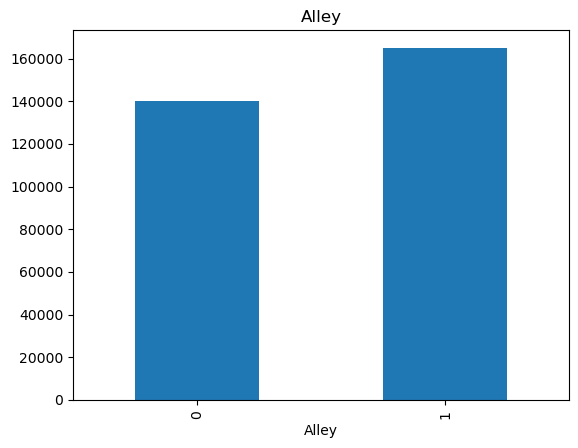

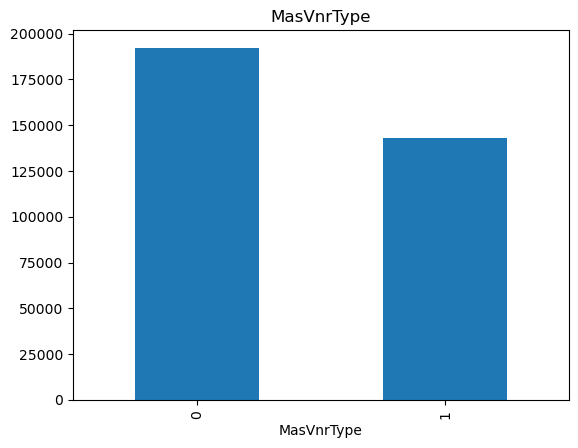

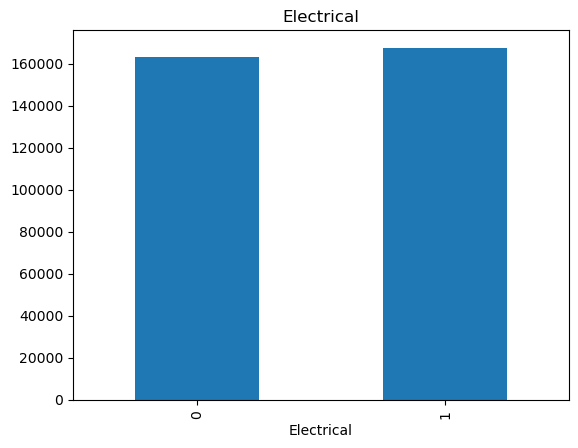

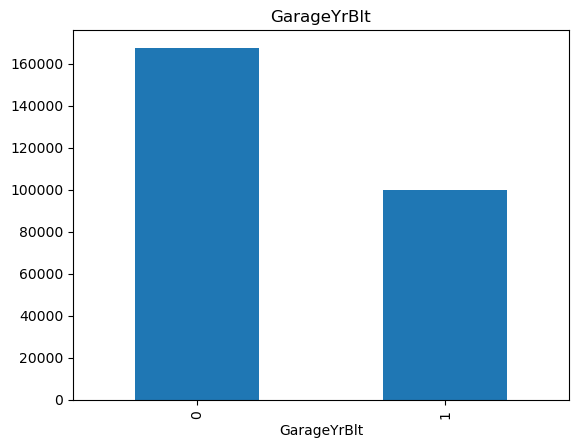

In [1192]:
#Since they are missing values in above columns, we need to find the relationship between missing values and Sales Price

for feature in df.columns:
    # Check if there are missing values in the feature
    if df[feature].isnull().sum() >= 1:
        # Copy the original DataFrame
        df1 = df.copy()
        
        # Create a variable that indicates 1 if the nan values are present or 0 otherwise
        df1[feature] = np.where(df1[feature].isnull(), 1, 0)
        
        # Calculate the median SalePrice where nan values are missing or present
        df1.groupby(feature)['SalePrice'].median().plot.bar()
        plt.title(feature)
        plt.show()

Here the relation between the missing values and the dependent variable i.e Sale Price is clearly visible. So We need to replace these nan values with something meaningful which we will do in the Feature Engineering.

In [1193]:
#From the above dataset some of the features like Unnamed: 0  is not required
df["Unnamed: 0"].count()

1460

In [1194]:
df.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000


### 2.All Numerical Variables:

In [1195]:
# list of numerical columns whose data type is not object'o'
num_column=df.select_dtypes(include=['float64','int64']).columns

print('Number of numerical columns: ', len(num_column))

# visualise the numerical variables
df[num_column].head()

Number of numerical columns:  36


,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,0,65,8450,7,5,2003,2003,196,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2008,208500
1,1,80,9600,6,8,1976,1976,0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,2007,181500
2,2,68,11250,7,5,2001,2002,162,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,2008,223500
3,3,60,9550,7,5,1915,1970,0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2006,140000
4,4,84,14260,8,5,2000,2000,350,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,2008,250000


### 3.Distribution of the Numerical Variables:
Numerical feature are of two types #continuous and #Discrete Variables

In [1196]:
# list of variables that contain year information
year_feature = [feature for feature in num_column if 'Yr' in feature or 'Year' in feature]

year_feature

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

#### Discrete Variables:

In [1197]:

#here we are finding all the discrete features which are not part of continuous feature and year feature

num_column = df.select_dtypes(include=['float64', 'int64']).columns

# Initialize an empty list for discrete features
discrete_feature = []

# Loop through each numerical feature and check the conditions
for feature in num_column:
    if len(df[feature].unique()) < 25 and feature not in year_feature:
        discrete_feature.append(feature)

# Print the count of discrete features
print("The Discrete feature Count:", len(discrete_feature))

The Discrete feature Count: 15


In [1198]:
discrete_feature

['OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal']

In [1199]:
#visualize the discrete features
df[discrete_feature].head()

,OverallQual,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,3SsnPorch,PoolArea,MiscVal
0,7,5,0,1,0,2,1,3,1,8,0,2,0,0,0
1,6,8,0,0,1,2,0,3,1,6,1,2,0,0,0
2,7,5,0,1,0,2,1,3,1,6,1,2,0,0,0
3,7,5,0,1,0,1,0,3,1,7,1,3,0,0,0
4,8,5,0,1,0,2,1,4,1,9,1,3,0,0,0


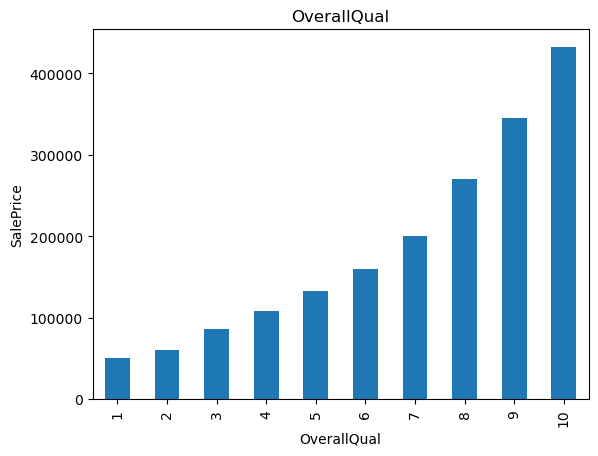

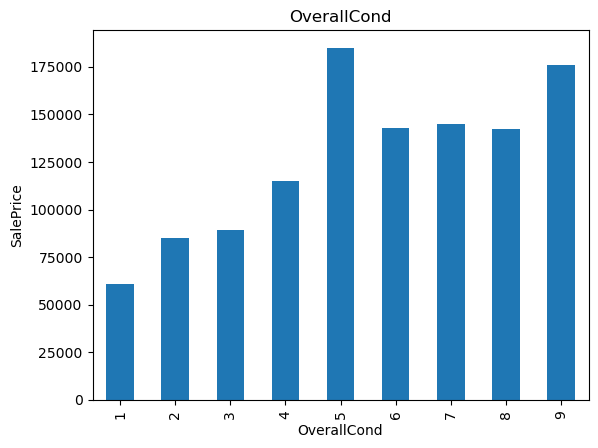

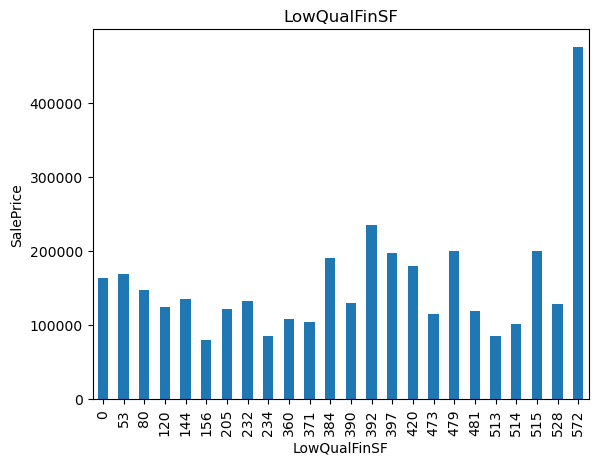

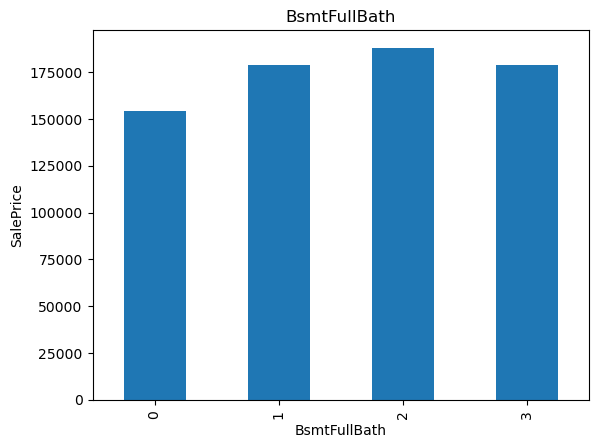

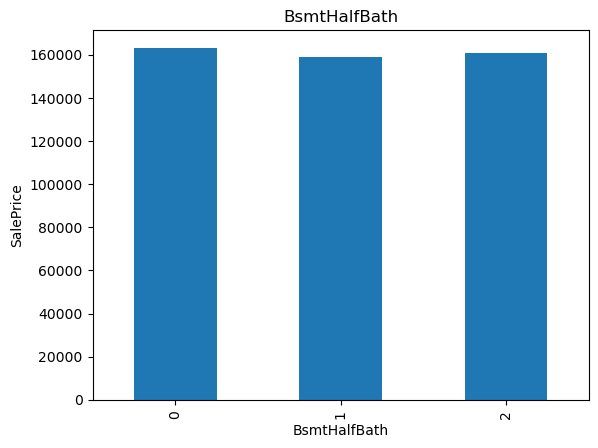

...

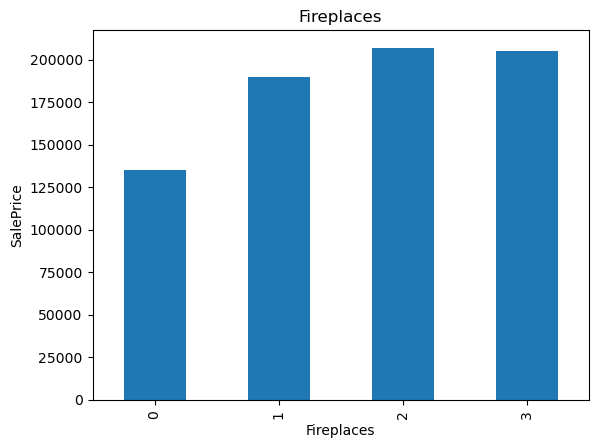

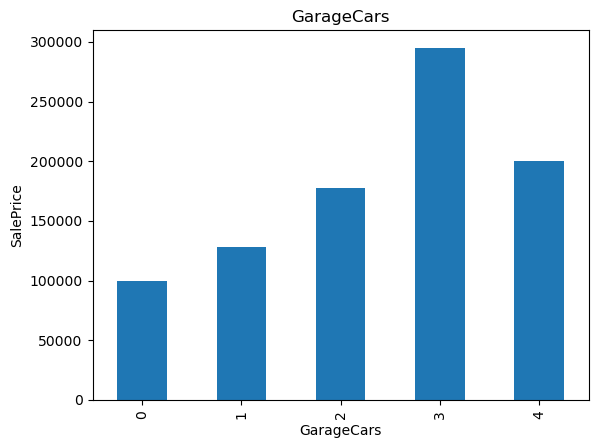

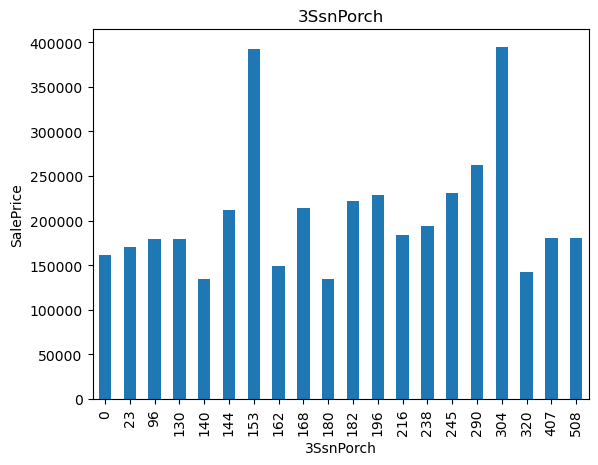

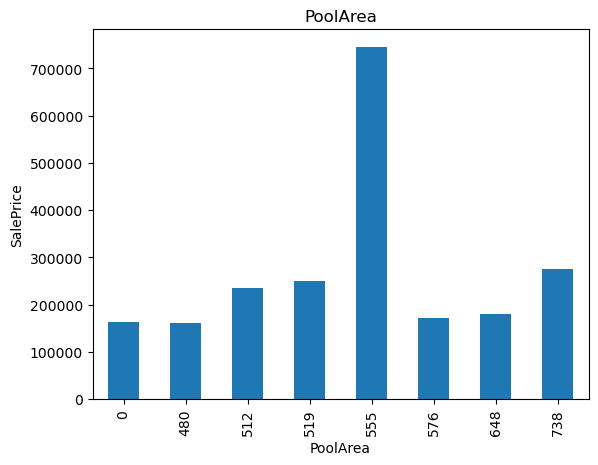

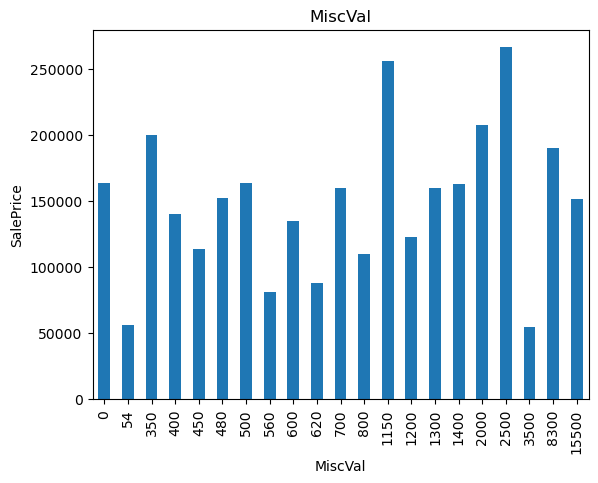

In [1200]:
## Lets Find the realtionship between discrete variables and Sale PRice

for feature in discrete_feature:
    df1.groupby(feature)['SalePrice'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.title(feature)
    plt.show()

#### Continuous Variables:

In [1201]:
# Get numerical columns (float64 and int64)
num_column = df.select_dtypes(include=['float64', 'int64']).columns

# Initialize an empty list for continuous features
continuous_feature = []

# Loop through each numerical feature and check if it's not in discrete_feature or year_feature
for feature in num_column:
    if feature not in discrete_feature + year_feature:
        continuous_feature.append(feature)

# Print the count of continuous features
print("Continuous feature Count:", len(continuous_feature))

Continuous feature Count: 17


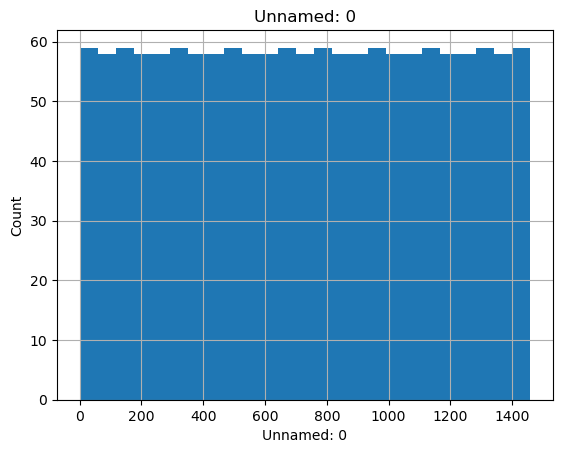

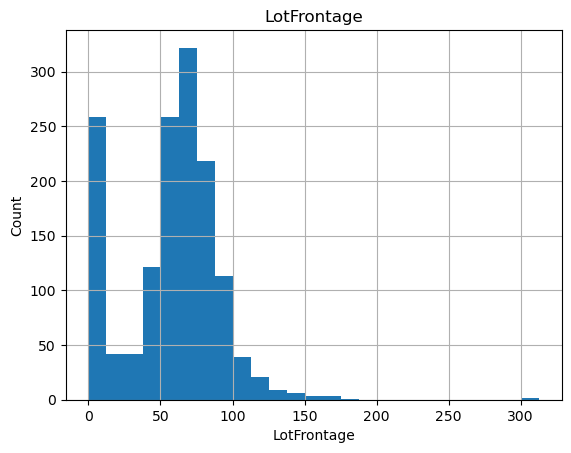

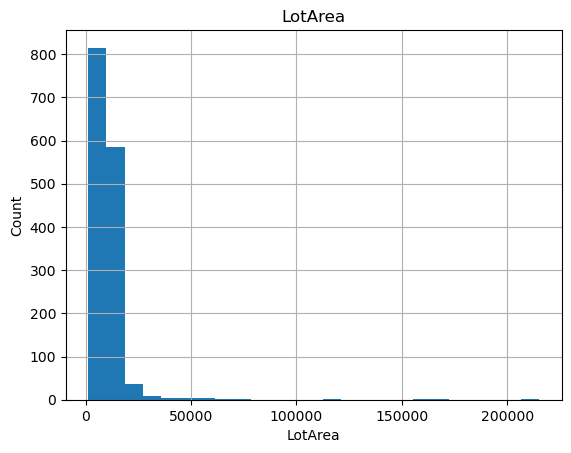

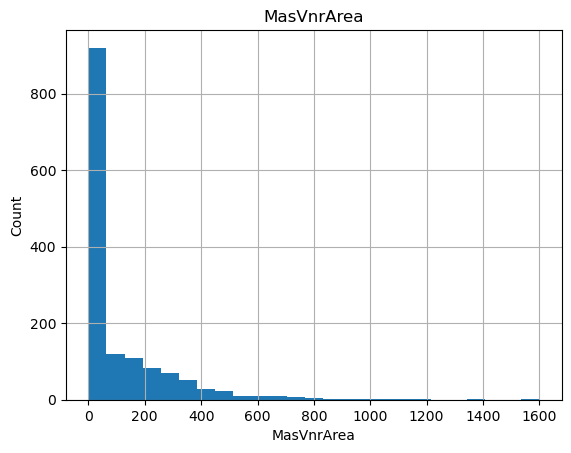

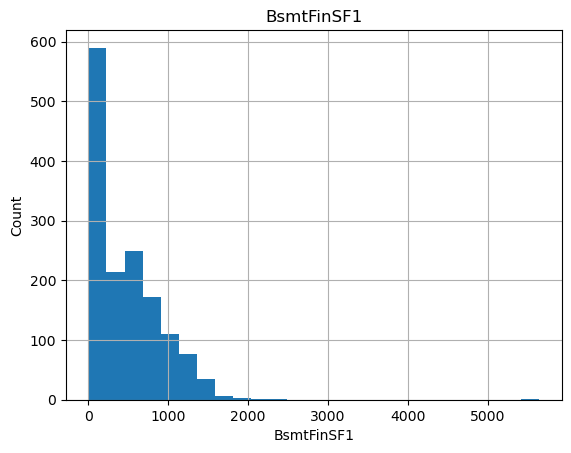

...

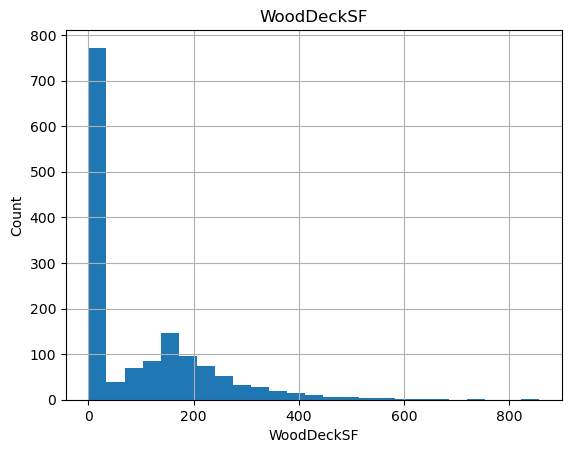

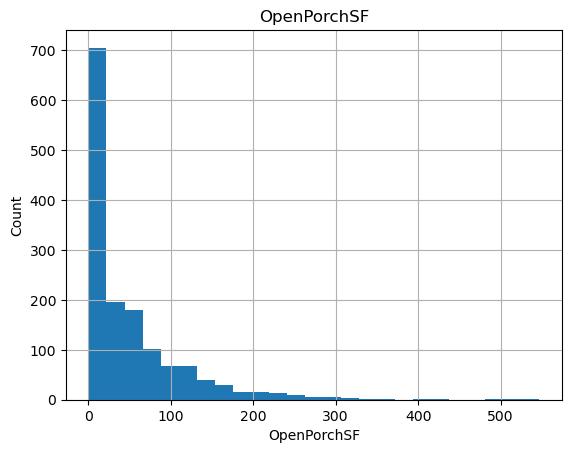

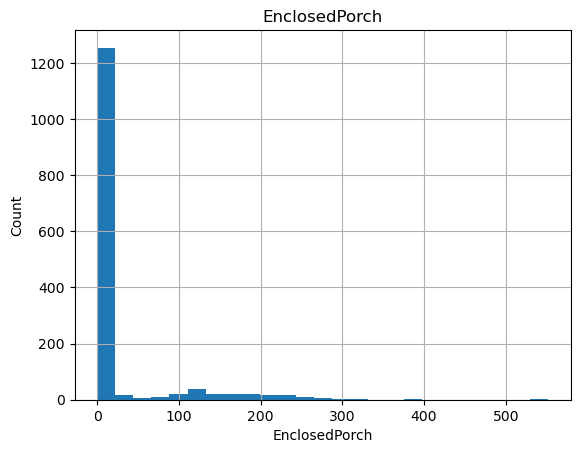

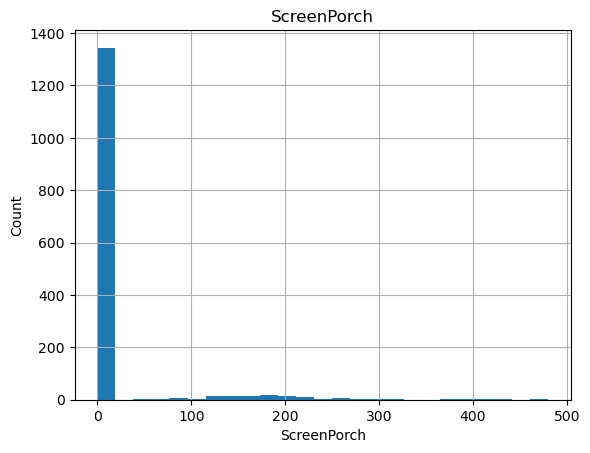

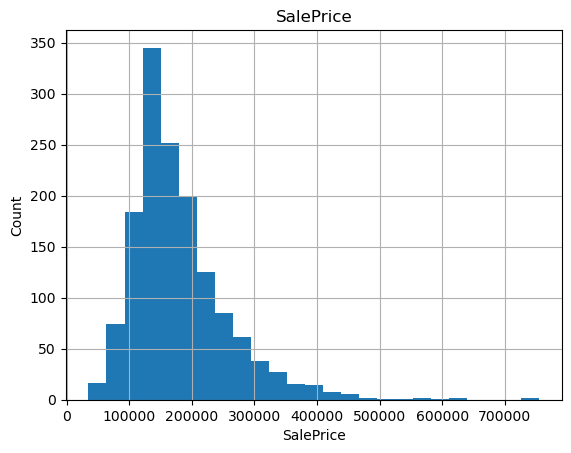

In [1202]:
## Visualizing the continuous values by creating histograms to understand the distribution

for feature in continuous_feature:
    df1=df.copy()
    df1[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

From above we can see that our data is Right-skewed, also known as positively skewed data, which shows that most of the values are concentrated on the left side of the distribution, with a tail extending toward the right. In other words, there are relatively few higher values that stretch out the distribution to the right.

#### Categorical Variables:

In [1203]:
categorical_features = df.select_dtypes(include=['object']).columns
categorical_features

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', 'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition'],
      dtype='object')

In [1204]:
df[categorical_features].head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition
0,SC60,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,No,Attchd,RFn,TA,TA,Y,No,No,No,Feb,WD,Normal
1,SC20,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,No,No,No,May,WD,Normal
2,SC60,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,No,No,No,Sep,WD,Normal
3,SC70,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,No,No,No,Feb,WD,Abnorml
4,SC60,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,No,No,No,Dec,WD,Normal


In [1205]:
#finding out the unique values of all categorical feature

for feature in categorical_features:
    print('The feature is :{}, Total categories:{}'.format(feature,len(df[feature].unique())))

The feature is :MSSubClass, Total categories:15
The feature is :MSZoning, Total categories:5
The feature is :Street, Total categories:2
The feature is :Alley, Total categories:3
The feature is :LotShape, Total categories:4
The feature is :LandContour, Total categories:4
The feature is :Utilities, Total categories:2
The feature is :LotConfig, Total categories:5
The feature is :LandSlope, Total categories:3
The feature is :Neighborhood, Total categories:25
The feature is :Condition1, Total categories:9
The feature is :Condition2, Total categories:8
The feature is :BldgType, Total categories:5
The feature is :HouseStyle, Total categories:8
The feature is :RoofStyle, Total categories:6
The feature is :RoofMatl, Total categories:8
The feature is :Exterior1st, Total categories:15
The feature is :Exterior2nd, Total categories:16
The feature is :MasVnrType, Total categories:4
The feature is :ExterQual, Total categories:4
The feature is :ExterCond, Total categories:5
The feature is :Foundation,

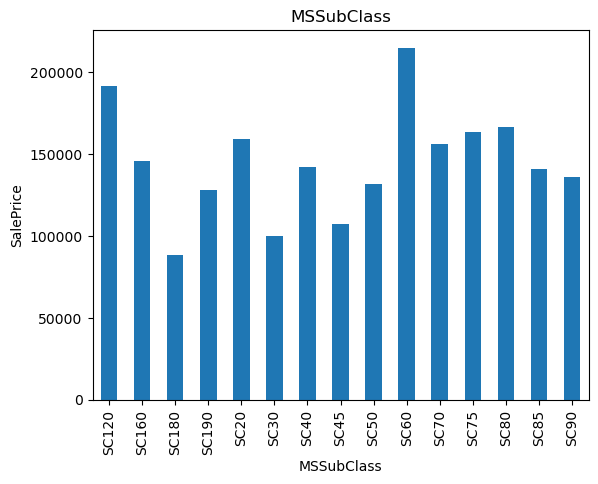

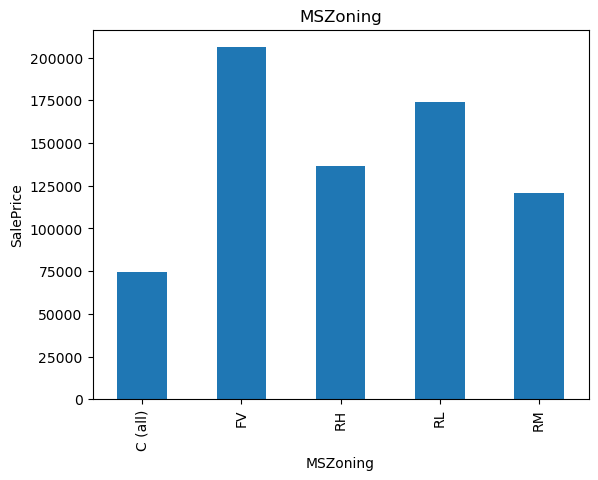

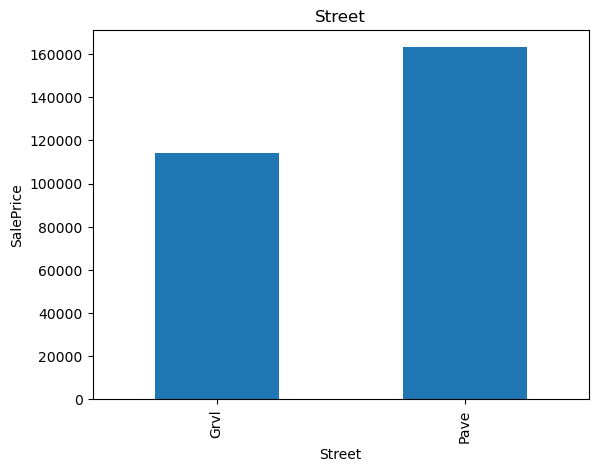

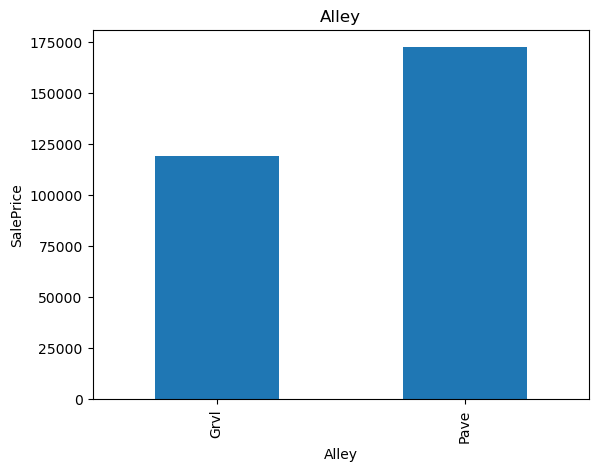

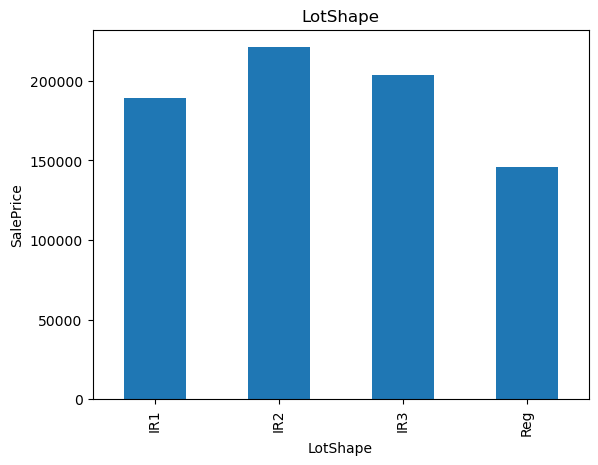

...

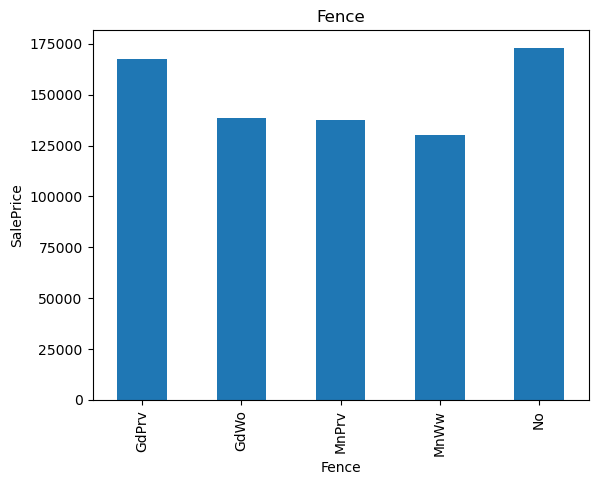

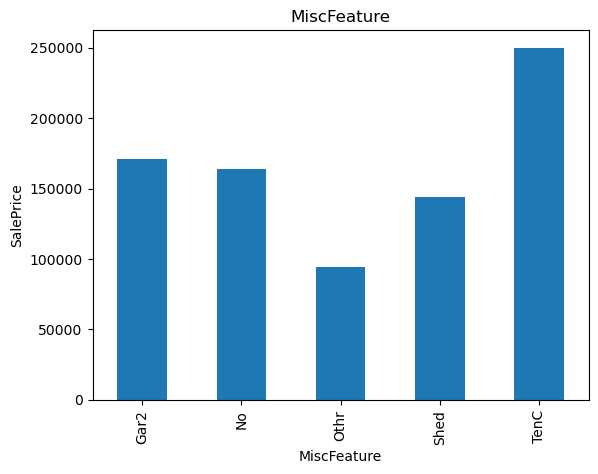

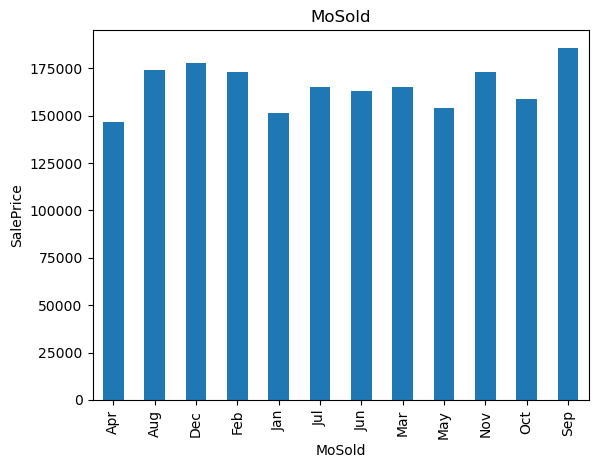

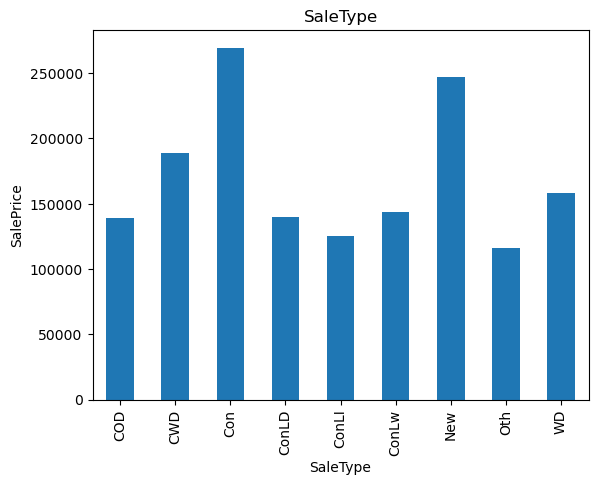

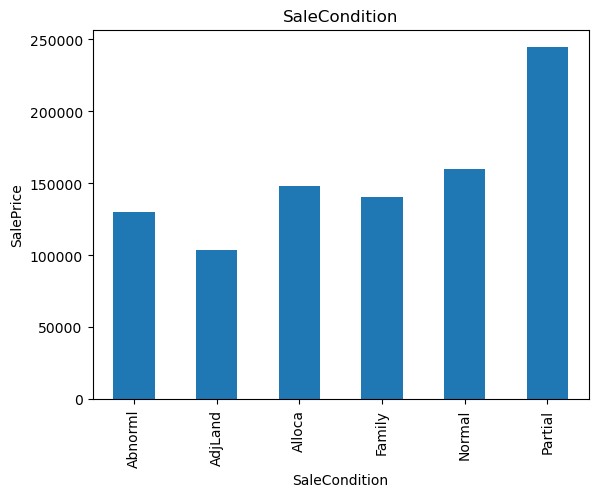

In [1206]:
#finding out the relationship between Categorical features and sale price

for feature in categorical_features:
    df1=df.copy()
    df1.groupby(feature)['SalePrice'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.title(feature)
    plt.show()

#### Data Normalization

#The above histograms for continuous numerical variables exhibit skewed distributions therefore If the data is highly skewed, the ML algorithms may perform poorly. 

#Using the logarithm transformation can reduce the effect of outliers and skewness, helping the model to perform better.

#A logarithmic transformation can help normalize or make the distribution more symmetric.

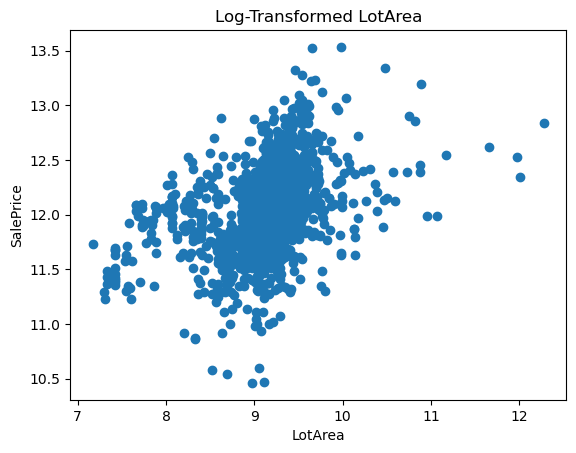

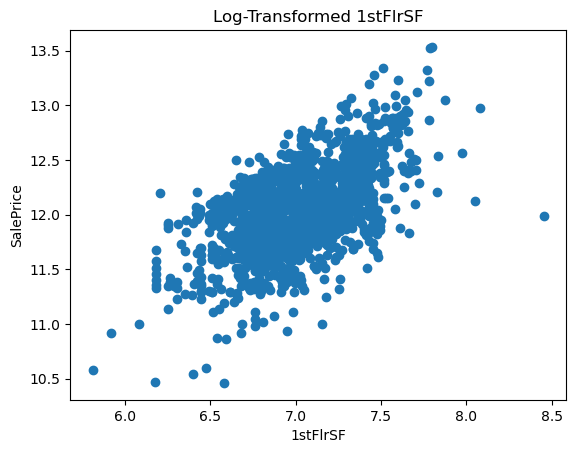

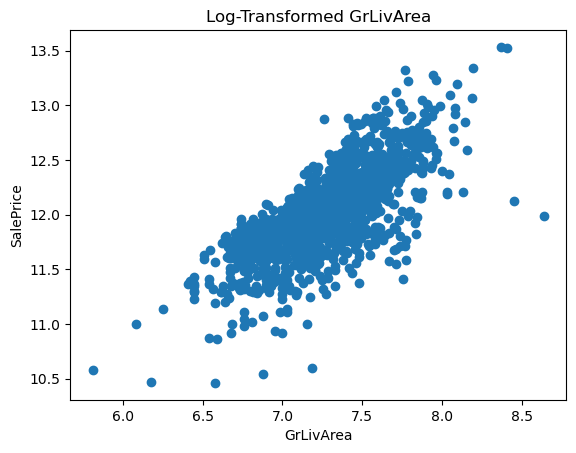

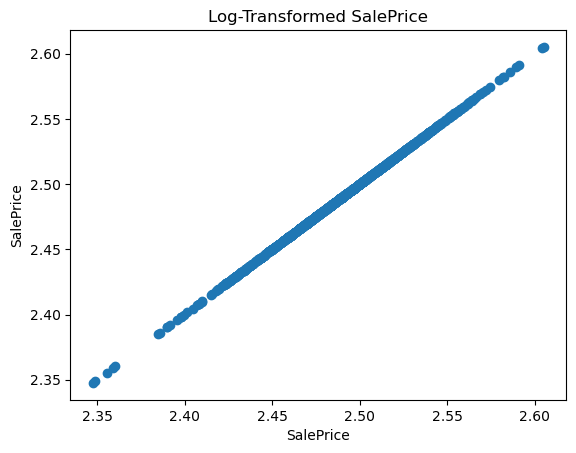

In [1207]:
#Logarithmic normalization
#This transformation is useful as it reduces the range of values and compresses the larger values, making it easier to analyze data with large variations. 
#Log transformation can be used to normalize data that is not normally distributed.
#log normalization is suitable since the data contains only positive values, as the logarithm is not defined for zero or negative values.

# Loop through continuous features
for feature in continuous_feature:
    df1 = df.copy()

    # Check if 0 exists in the feature column
    if 0 not in df1[feature].unique():
        # Apply logarithmic transformation if there are no 0 values
        df1[feature] = np.log(df1[feature])
        df1['SalePrice'] = np.log(df1['SalePrice'])

        # Scatter plot to visualize the relationship after log transformation
        plt.scatter(df1[feature], df1['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.title(f"Log-Transformed {feature}")
        plt.show()

### Temporal Variables(Eg: Datetime Variables)

From the Dataset we have 4 year variables. We have extract information from the datetime variables like no of years or no of days. One example in this specific scenario can be difference in years between the year the house was built and the year the house was sold.

In [1208]:
# Get numerical columns (float64 and int64)
num_column = df.select_dtypes(include=['float64', 'int64']).columns

# Initialize an empty list for year-related features
year_feature = []

# Loop through numerical features and check for 'Yr' or 'Year' in the column name
for feature in num_column:
    if 'Yr' in feature or 'Year' in feature:
        year_feature.append(feature)

# Print the year-related features
print(year_feature)

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']


In [1209]:
for feature in year_feature:
    print(feature, df[feature].unique())

YearBuilt [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905]
YearRemodAdd [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1978 1974]
GarageYrBlt [2003. 1976. 2001. 1998. 2000. 1993. 2004. 1973. 1931. 1939. 1965. 2005.
 1962. 2006.

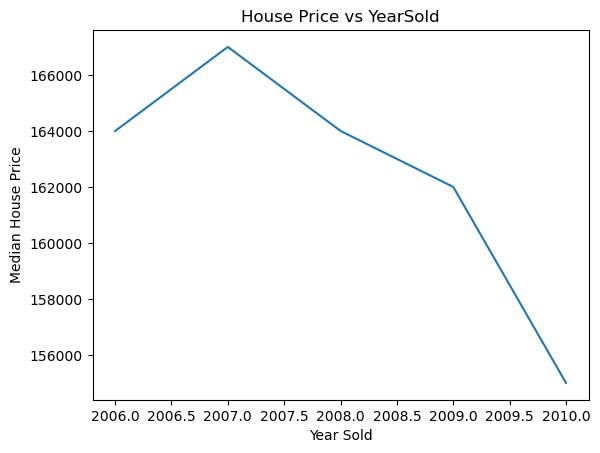

In [1210]:
## Analyzing the Temporal Datetime Variables
## We will check whether there is a relation between year the house is sold and the sales price

df.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Year Sold')
plt.ylabel('Median House Price')
plt.title("House Price vs YearSold")
plt.show()

#We can see that sale price is decreasing as the property ages

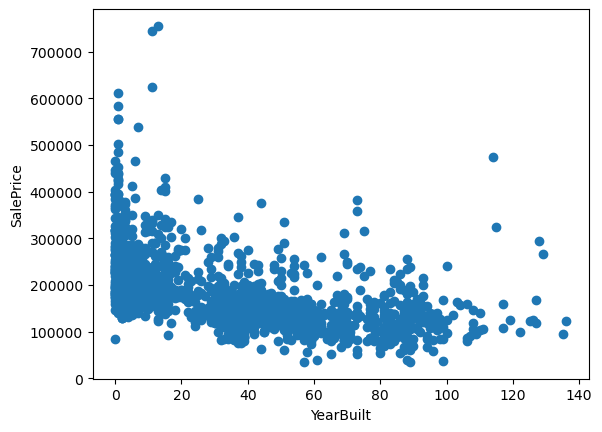

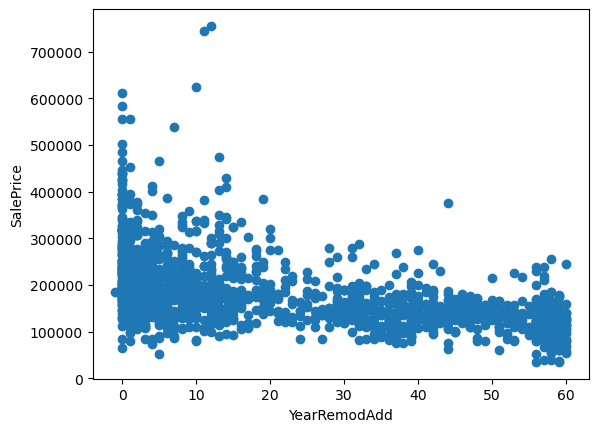

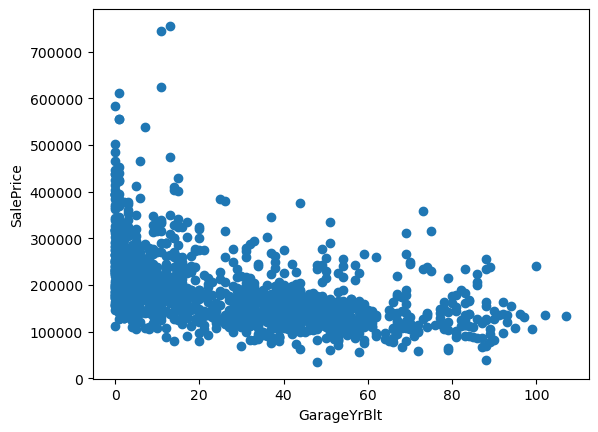

In [1211]:
#comparing the difference between All years feature with SalePrice

for feature in year_feature:
    df1=df.copy()
    if feature!='YrSold':
        ## We will capture the difference between year variable and year the house was sold for
        df1[feature]=df1['YrSold']-df1[feature]

        plt.scatter(df1[feature],df1['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.show()

#### Outliers

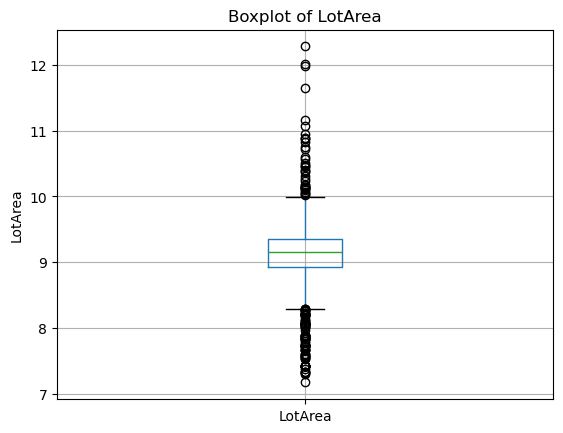

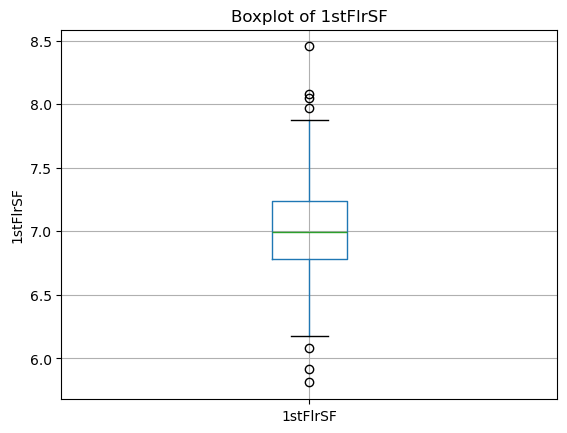

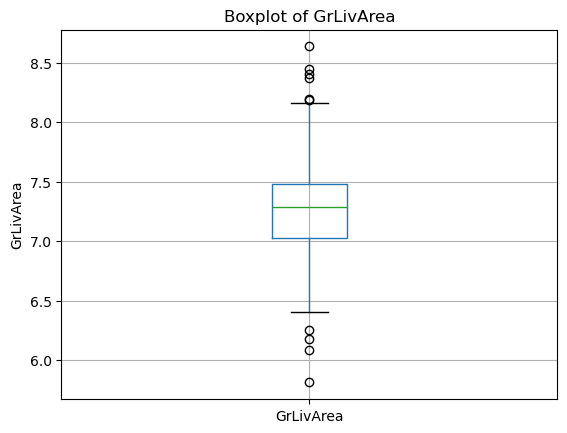

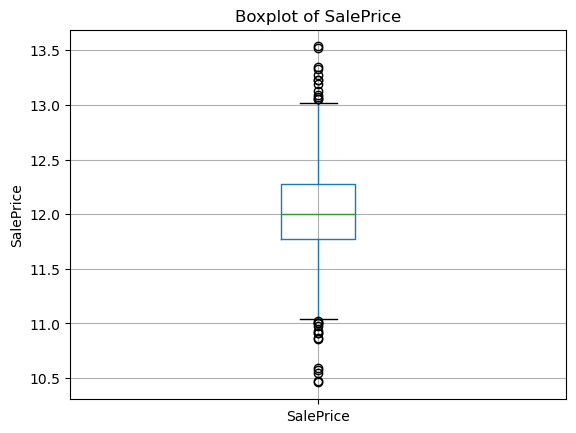

In [1212]:
# Loop through continuous features
for feature in continuous_feature:
    df1 = df.copy()
    
    # Check if 0 is in the unique values for the feature
    if 0 not in df1[feature].unique():
        # Apply log transformation if there are no 0 values
        df1[feature] = np.log(df1[feature])
        
        # Create a boxplot to detect outliers
        df1.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(f"Boxplot of {feature}")
        plt.show()

Explanation:

The loop iterates through each feature in continuous_feature.

If the feature does not contain any zeros, it applies a logarithmic transformation (np.log()).

Then, a boxplot is created to help visualize the distribution and potential outliers of the transformed feature. The title of each plot dynamically reflects the feature being plotted.

### Feature Engineering:

We will be performing all the below steps in Feature Engineering

1) Missing values Handling
2) Temporal variables
3) Create New columns
4) Categorical variables: remove rare labels
5) Standardising the values of the variables to the same range

In [1213]:
y= df['SalePrice']

In [1214]:
y

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

### Missing Values Handling:

In [1215]:
## Let us capture all the nan values
## First lets handle Categorical features which are missing
categorical_features = df.select_dtypes(include=['object']).columns

for feature in categorical_features:  # Iterate over categorical columns
    if df[feature].isnull().sum() >= 1:  # Check if there are missing values
        print(f"{feature}: {np.round(df[feature].isnull().mean(),4)* 100}% missing values")

Alley: 93.77% missing values
MasVnrType: 59.730000000000004% missing values
Electrical: 0.06999999999999999% missing values


In [1216]:
#since the missing value percentage is more than 50% hence we are dropping the columns 
df=df.drop(['Unnamed: 0','Alley','MasVnrType'], axis=1)

In [1217]:
## Replace missing value with a new label
def replace_cat_feature(df):
    # Iterate over categorical columns and replace missing values with 'Missing'
    for feature in df.select_dtypes(include=['object']).columns:
        if df[feature].isnull().sum() >= 1:  # Only process columns with missing values
            df[feature] = df[feature].fillna('Missing')
    return df

# Apply the function to replace missing values
df = replace_cat_feature(df)

# Verify that no missing values are left in the categorical columns
print(df.select_dtypes(include=['object']).isnull().sum())

MSSubClass       0
MSZoning         0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
MoSold           0
SaleType         0
SaleCondition    0
dtype: int64


In [1218]:
cat_features = df.select_dtypes(include=['object']).columns
cat_features

Index(['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [1219]:

df.shape

(1460, 78)

In [1220]:
# Get numerical columns (float64 and int64)
num_column = df.select_dtypes(include=['float64', 'int64']).columns

# Initialize an empty list for continuous features
continuous_feat= []

# Loop through each numerical feature and check if it's not in discrete_feature or year_feature
for feature in num_column:
    if feature not in discrete_feature + year_feature:
        continuous_feat.append(feature)

# Print the count of continuous features
print("Continuous feature Count:", len(continuous_feat))

Continuous feature Count: 16


In [1221]:
continuous_feat

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'SalePrice']

In [1222]:
## Now lets check for continuous numerical variables the contains missing values
continuous_feat
# Check for missing values in each feature in continuous_feat
for feature in continuous_feat:
    missing_percentage = np.round(df[feature].isnull().mean() * 100, 2)  # Rounded to 2 decimal places
    if missing_percentage > 0:  # Only print features with missing values
        print(f"{feature}: {missing_percentage}% missing values")
    else:
        print(f'{feature}:"No missing values found"')

LotFrontage:"No missing values found"
LotArea:"No missing values found"
MasVnrArea:"No missing values found"
BsmtFinSF1:"No missing values found"
BsmtFinSF2:"No missing values found"
BsmtUnfSF:"No missing values found"
TotalBsmtSF:"No missing values found"
1stFlrSF:"No missing values found"
2ndFlrSF:"No missing values found"
GrLivArea:"No missing values found"
GarageArea:"No missing values found"
WoodDeckSF:"No missing values found"
OpenPorchSF:"No missing values found"
EnclosedPorch:"No missing values found"
ScreenPorch:"No missing values found"
SalePrice:"No missing values found"


In [1223]:
# Check for missing values in each feature in discrete_feature
for feature in discrete_feature:
    missing_percentage = np.round(df[feature].isnull().mean() * 100, 2)  # Rounded to 2 decimal places
    if missing_percentage > 0:  # Only print features with missing values
        print(f"{feature}: {missing_percentage}% missing values")
    else:
        print(f'{feature}:"No missing values found"')

OverallQual:"No missing values found"
OverallCond:"No missing values found"
LowQualFinSF:"No missing values found"
BsmtFullBath:"No missing values found"
BsmtHalfBath:"No missing values found"
FullBath:"No missing values found"
HalfBath:"No missing values found"
BedroomAbvGr:"No missing values found"
KitchenAbvGr:"No missing values found"
TotRmsAbvGrd:"No missing values found"
Fireplaces:"No missing values found"
GarageCars:"No missing values found"
3SsnPorch:"No missing values found"
PoolArea:"No missing values found"
MiscVal:"No missing values found"


In [1224]:
year_feat = [feature for feature in num_column if 'Yr' in feature or 'Year' in feature]
year_feat

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [1225]:
# Check for missing values in each feature in year_feature
for feature in year_feat:
    missing_percentage = np.round(df[feature].isnull().mean() * 100, 2)  # Rounded to 2 decimal places
    if missing_percentage > 0:  # Only print features with missing values
        print(f"{feature}: {missing_percentage}% missing values")
    else:
        print(f'{feature}:"No missing values found"')

YearBuilt:"No missing values found"
YearRemodAdd:"No missing values found"
GarageYrBlt: 5.55% missing values
YrSold:"No missing values found"


In [1226]:
df['GarageYrBlt'].value_counts()

GarageYrBlt
2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
          ..
1927.0     1
1900.0     1
1906.0     1
1908.0     1
1933.0     1
Name: count, Length: 97, dtype: int64

In [1227]:
# replacing missing values 
df['GarageYrBlt']=df['GarageYrBlt'].fillna(2005.0)

In [1228]:
df['GarageYrBlt'].isnull().sum()

0

In [1229]:
df.isnull().sum()[0:50]

MSSubClass      0
MSZoning        0
LotFrontage     0
LotArea         0
Street          0
LotShape        0
LandContour     0
Utilities       0
LotConfig       0
LandSlope       0
Neighborhood    0
Condition1      0
Condition2      0
BldgType        0
HouseStyle      0
OverallQual     0
OverallCond     0
YearBuilt       0
YearRemodAdd    0
RoofStyle       0
RoofMatl        0
Exterior1st     0
Exterior2nd     0
MasVnrArea      0
ExterQual       0
ExterCond       0
Foundation      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinSF1      0
BsmtFinType2    0
BsmtFinSF2      0
BsmtUnfSF       0
TotalBsmtSF     0
Heating         0
HeatingQC       0
CentralAir      0
Electrical      0
1stFlrSF        0
2ndFlrSF        0
LowQualFinSF    0
GrLivArea       0
BsmtFullBath    0
BsmtHalfBath    0
FullBath        0
HalfBath        0
BedroomAbvGr    0
KitchenAbvGr    0
dtype: int64

In [1230]:
df.isnull().sum()[50:73]

KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageYrBlt      0
GarageFinish     0
GarageCars       0
GarageArea       0
GarageQual       0
GarageCond       0
PavedDrive       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
PoolQC           0
Fence            0
MiscFeature      0
MiscVal          0
dtype: int64

In [1231]:
df.head(50)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,SC60,RL,65,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,SC20,RL,80,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,SC60,RL,68,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,SC70,RL,60,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,SC60,RL,84,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,SC50,RL,85,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,No,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000
6,SC20,RL,75,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,307000
7,SC60,RL,0,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,No,No,Shed,350,Nov,2009,WD,Normal,200000
8,SC50,RM,51,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,No,No,No,0,Apr,2008,WD,Abnorml,129900
9,SC190,RL,50,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,No,No,No,0,Jan,2008,WD,Normal,118000


#### Outliers

In [1232]:
#checking outliers for  numerical features
for i in num_column:
    Q1 = df[i].quantile(0.25)
    print("The first quantile for the column", i, "is given by", Q1)
    Q2 = df[i].quantile(0.50)
    print("The second quantile for the column", i, "is given by", Q2)
    Q3 = df[i].quantile(0.75)
    print("The third quantile for the column", i, "is given by", Q3)
    IQR = Q3 - Q1
    print("The interquartile range for the column", i, "is given by", IQR)
    LL = Q1 - 1.5 * IQR
    print("The lower limit for the column", i, "is given by", LL)
    UL = Q3 + 1.5 * IQR
    print("The upper limit for the column", i, "is given by", UL)
    n = df[(df[i] < LL) | (df[i] > UL)].shape[0]
    print("The number of outliers for column", i, "is given by", n)
    df[i] = np.where((df[i] < LL) | (df[i] > UL), df[i].mean(), df[i])
    
    print("   ")
    print("   ")

The first quantile for the column LotFrontage is given by 42.0
The second quantile for the column LotFrontage is given by 63.0
The third quantile for the column LotFrontage is given by 79.0
The interquartile range for the column LotFrontage is given by 37.0
The lower limit for the column LotFrontage is given by -13.5
The upper limit for the column LotFrontage is given by 134.5
The number of outliers for column LotFrontage is given by 16
   
   
The first quantile for the column LotArea is given by 7553.5
The second quantile for the column LotArea is given by 9478.5
The third quantile for the column LotArea is given by 11601.5
The interquartile range for the column LotArea is given by 4048.0
The lower limit for the column LotArea is given by 1481.5
The upper limit for the column LotArea is given by 17673.5
The number of outliers for column LotArea is given by 69
   
   
The first quantile for the column OverallQual is given by 5.0
The second quantile for the column OverallQual is given 

In [1233]:
#imputing outliers of continuous numerical features
for i in num_column:
    Q1 = df[i].quantile(0.25)
    print("The first quantile for the column", i, "is given by", Q1)
    Q2 = df[i].quantile(0.50)
    print("The second quantile for the column", i, "is given by", Q2)
    Q3 = df[i].quantile(0.75)
    print("The third quantile for the column", i, "is given by", Q3)
    IQR = Q3 - Q1
    print("The interquartile range for the column", i, "is given by", IQR)
    LL = Q1 - 1.5 * IQR
    print("The lower limit for the column", i, "is given by", LL)
    UL = Q3 + 1.5 * IQR
    print("The upper limit for the column", i, "is given by", UL)
    n = df[(df[i] < LL) | (df[i] > UL)].shape[0]
    print("The number of outliers for column", i, "is given by", n)
    df[i] = np.where((df[i] < LL) | (df[i] > UL), df[i].mean(), df[i])
    m = df[(df[i] < LL) | (df[i] > UL)].shape[0]
    print("The number of outliers after imputation for column", i, "is given by", m)
    print("   ")
    print("   ")

The first quantile for the column LotFrontage is given by 42.0
The second quantile for the column LotFrontage is given by 61.5
The third quantile for the column LotFrontage is given by 78.0
The interquartile range for the column LotFrontage is given by 36.0
The lower limit for the column LotFrontage is given by -12.0
The upper limit for the column LotFrontage is given by 132.0
The number of outliers for column LotFrontage is given by 2
The number of outliers after imputation for column LotFrontage is given by 0
   
   
The first quantile for the column LotArea is given by 7560.0
The second quantile for the column LotArea is given by 9491.0
The third quantile for the column LotArea is given by 11107.25
The interquartile range for the column LotArea is given by 3547.25
The lower limit for the column LotArea is given by 2239.125
The upper limit for the column LotArea is given by 16428.125
The number of outliers for column LotArea is given by 54
The number of outliers after imputation for 

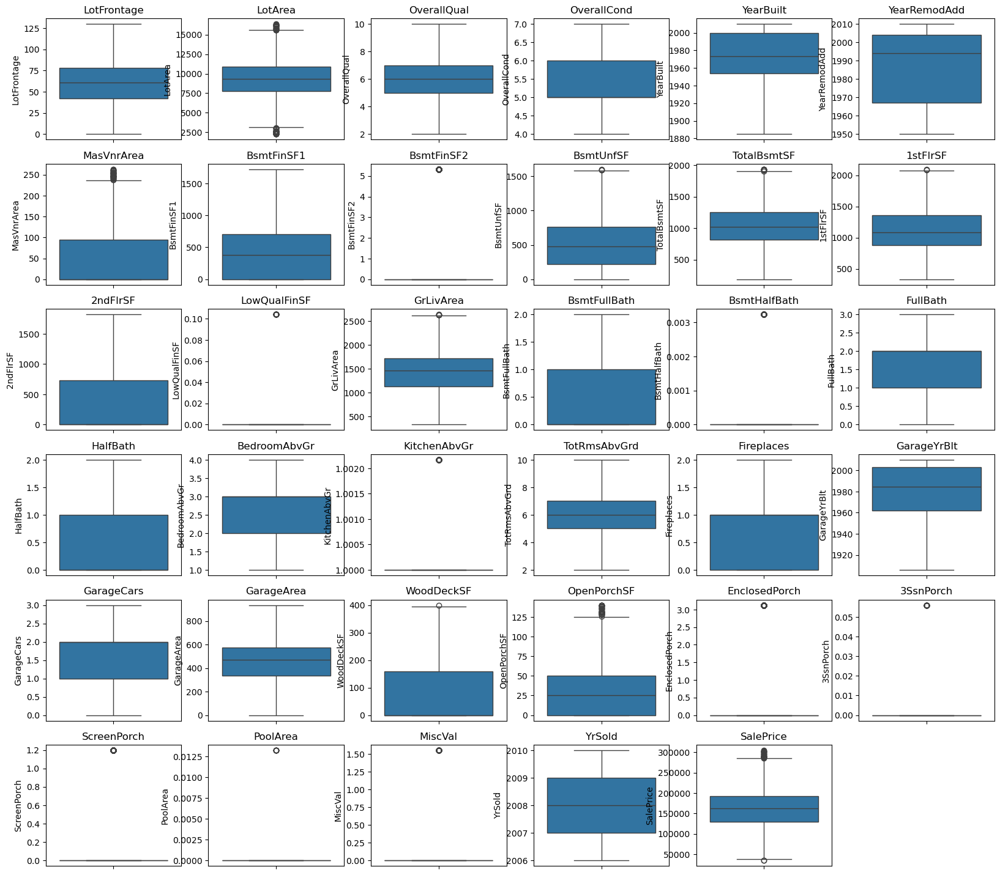

In [1234]:
import math
num_column
num_cols = 6  # Define the number of columns per row
num_rows = math.ceil(len(num_column) / num_cols)  # Ensure correct row calculation
plt.figure(figsize=(20, num_rows * 3)) 
for i, col in enumerate(num_column, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(y=df[col])
    plt.title(col)

In [1235]:
from scipy.stats.mstats import winsorize

# Define the columns where you want to remove outliers
outlier_columns = ['LotArea', 'MasVnrArea', 'GrLivArea', 'SalePrice']  
def winsorize_outliers(df, columns, limit=0.05):
    df_clean = df.copy()
    for col in columns:
        df_clean[col] = winsorize(df_clean[col], limits=[limit, limit])  # Apply winsorization
    return df_clean

# Apply Winsorization
df = winsorize_outliers(df, outlier_columns)

# Check if outliers are removed
print(df[outlier_columns].describe())


            LotArea   MasVnrArea    GrLivArea      SalePrice
count   1460.000000  1460.000000  1460.000000    1460.000000
mean    9361.662079    46.798329  1465.156925  165591.365573
std     2565.941886    66.277573   405.020943   47757.528680
min     4224.000000     0.000000   848.000000   88000.000000
25%     7800.000000     0.000000  1129.500000  129975.000000
50%     9345.000000     0.000000  1464.000000  163000.000000
75%    10920.250000    95.000000  1728.000000  192035.000000
max    14100.000000   206.000000  2274.000000  264132.000000


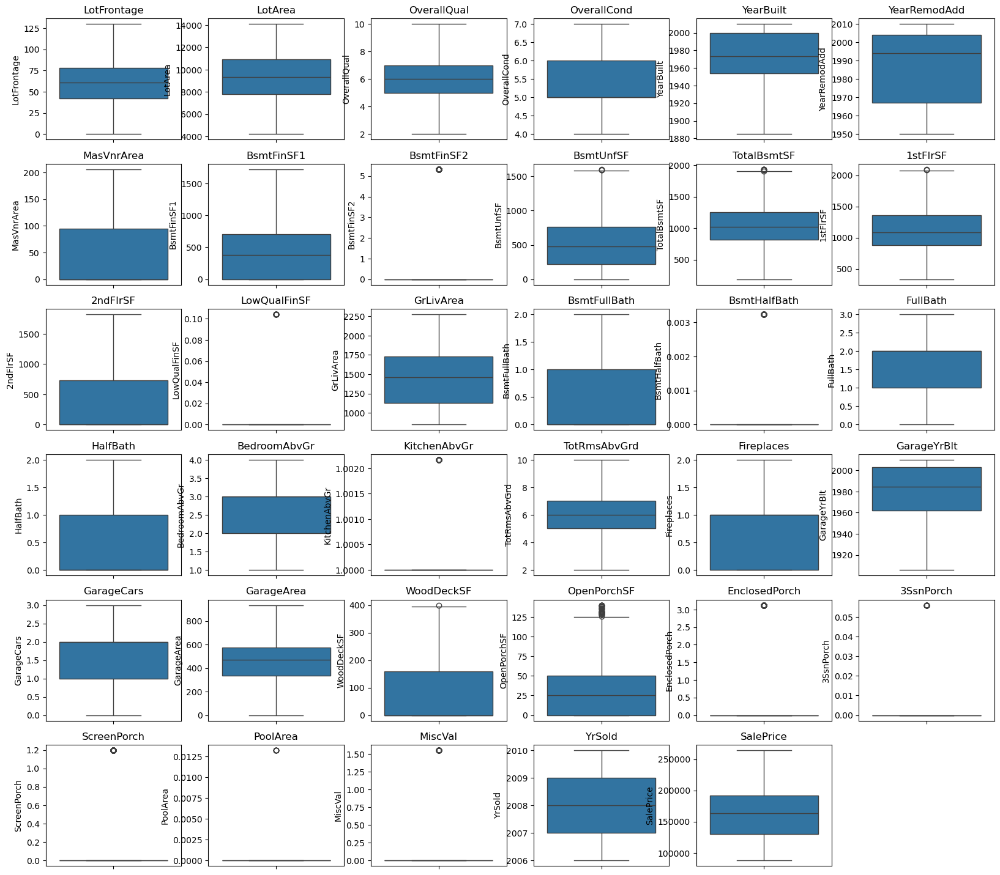

In [1236]:
num_column
num_cols = 6  # Define the number of columns per row
num_rows = math.ceil(len(num_column) / num_cols)  # Ensure correct row calculation
plt.figure(figsize=(20, num_rows * 3)) 
for i, col in enumerate(num_column, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(y=df[col])
    plt.title(col)

#### Handling Temporal Variables:

In [1237]:
## Temporal Variables (Date Time Variables)
## Here we are calculating the difference between the Year sold to the YearBuilt','YearRemodAdd','GarageYrBlt'

for feature in ['YearBuilt','YearRemodAdd','GarageYrBlt']:
       
    df[feature]=df['YrSold']-df[feature]

In [1238]:
df[['YearBuilt','YearRemodAdd','GarageYrBlt']].head()

,YearBuilt,YearRemodAdd,GarageYrBlt
0,5.0,5.0,5.0
1,31.0,31.0,31.0
2,7.0,6.0,7.0
3,91.0,36.0,8.0
4,8.0,8.0,8.0


#### New columns

In [1239]:
# Calculate the price per square foot: 
df['PricePerSqFt'] = df['SalePrice'] / (df['GrLivArea'] + df['TotalBsmtSF'])

#Calculate the age of property:
df['AgeAtSale'] = df['YrSold'] - df['YearBuilt']

#Calculate the total square footage:
df['TotalSqFt'] = df['1stFlrSF'] + df['2ndFlrSF'] + df['TotalBsmtSF']

#Calculate the total number of bathrooms:
df['TotalBathrooms'] = df['FullBath'] + 0.5 * df['HalfBath']+ df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']

#Calculate the total porch area:
df['TotalPorchArea'] = df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch']

#Calculate the total finished square footage:
df['TotalFinishedSqFt'] = df['BsmtFinSF1'] + df['BsmtFinSF2'] + df['GrLivArea']

#Create total Quality-Score:
df['TotalQualityScore'] = df['OverallQual'] + df['OverallCond']

#Create total Garage-Score:
df['TotalGarageScore'] = df['GarageCars'] * df['GarageArea']

#Calculate the total outdoor-Area:
df['TotalOutdoorArea'] = df['WoodDeckSF'] + df['OpenPorchSF'] + df['PoolArea']

df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,SC60,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,5.0,5.0,Gable,CompShg,VinylSd,VinylSd,196.000000,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.000000,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,No,Attchd,5.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.000000,0.0,0.0,0.0,No,No,No,0.0,Feb,2008.0,WD,Normal,208500.0,81.254871,2003.0,2566.0,3.500000,61.000000,2416.0,12.000000,1096.0,61.0
1,SC20,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,5.575342,31.0,31.0,Gable,CompShg,MetalSd,MetalSd,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0.0,0.003231,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,TA,Attchd,31.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,0.000000,0.0,0.0,0.0,No,No,No,0.0,May,2007.0,WD,Normal,181500.0,71.909667,1976.0,2524.0,2.001616,0.000000,2240.0,11.575342,920.0,298.0
2,SC60,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,7.0,6.0,Gable,CompShg,VinylSd,VinylSd,162.000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.000000,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,TA,Attchd,7.0,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.000000,0.0,0.0,0.0,No,No,No,0.0,Sep,2008.0,WD,Normal,223500.0,82.594235,2001.0,2706.0,3.500000,42.000000,2272.0,12.000000,1216.0,42.0
3,SC70,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.000000,91.0,36.0,Gable,CompShg,Wd Sdng,Wd Shng,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1.0,0.000000,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Gd,Detchd,8.0,Unf,3.0,642.0,TA,TA,Y,0.0,35.0,3.127709,0.0,0.0,0.0,No,No,No,0.0,Feb,2006.0,WD,Abnorml,140000.0,56.611403,1915.0,2473.0,2.000000,38.127709,1933.0,12.000000,1926.0,35.0
4,SC60,RL,84.0,14100.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.000000,8.0,8.0,Gable,CompShg,VinylSd,VinylSd,68.765396,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.000000,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,TA,Attchd,8.0,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.000000,0.0,0.0,0.0,No,No,No,0.0,Dec,2008.0,WD,Normal,250000.0,74.783129,2000.0,3343.0,3.500000,84.000000,2853.0,13.000000,2508.0,276.0


### Visualizing the New column created

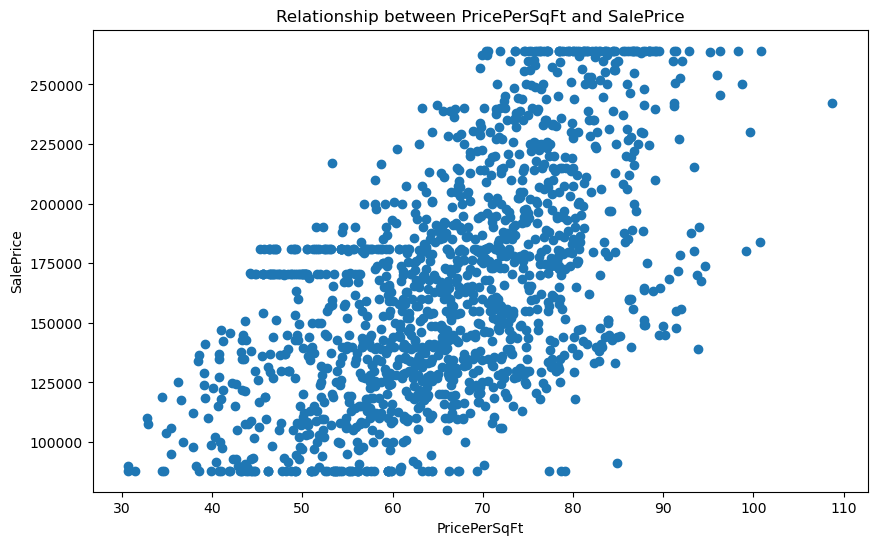

In [1240]:
plt.figure(figsize=(10, 6))
plt.scatter(df['PricePerSqFt'],df['SalePrice'])
plt.xlabel('PricePerSqFt')
plt.ylabel('SalePrice')
plt.title('Relationship between PricePerSqFt and SalePrice')
plt.show()

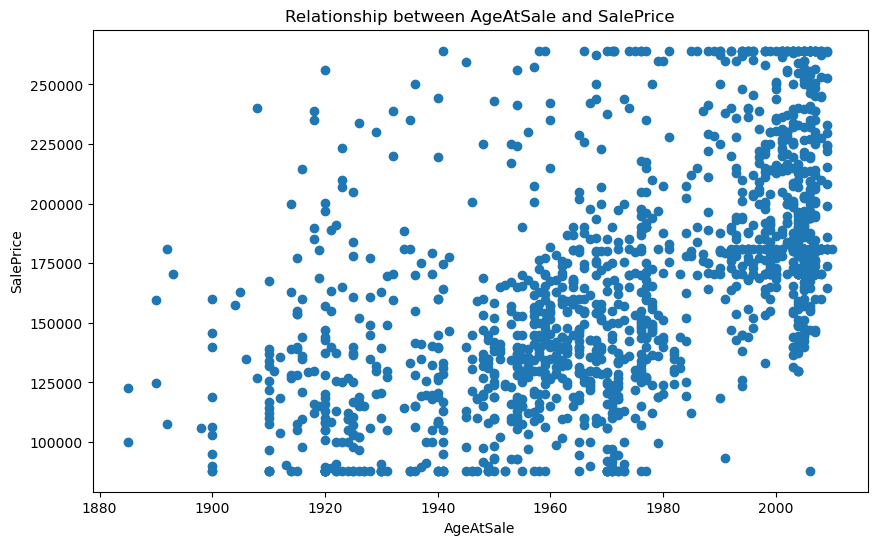

In [1241]:
plt.figure(figsize=(10, 6))
plt.scatter(df['AgeAtSale'],df['SalePrice'])
plt.xlabel('AgeAtSale')
plt.ylabel('SalePrice')
plt.title('Relationship between AgeAtSale and SalePrice')
plt.show()

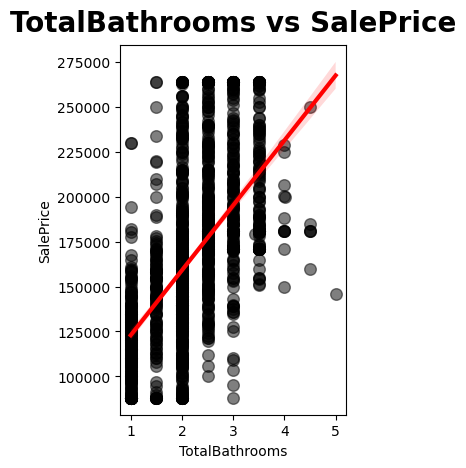

In [1242]:
plt.subplot(1, 2, 2)
sns.regplot(x=df["TotalBathrooms"], y=df["SalePrice"], color="black",
            scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
plt.title("TotalBathrooms vs SalePrice", pad=10, size=20, fontweight="black")
plt.show()

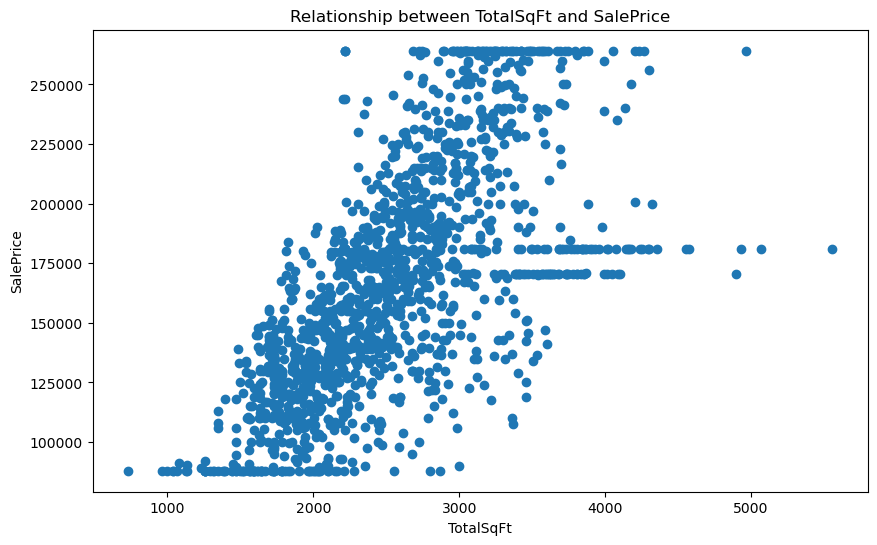

In [1243]:
plt.figure(figsize=(10, 6))
plt.scatter(df['TotalSqFt'],df['SalePrice'])
plt.xlabel('TotalSqFt')
plt.ylabel('SalePrice')
plt.title('Relationship between TotalSqFt and SalePrice')
plt.show()

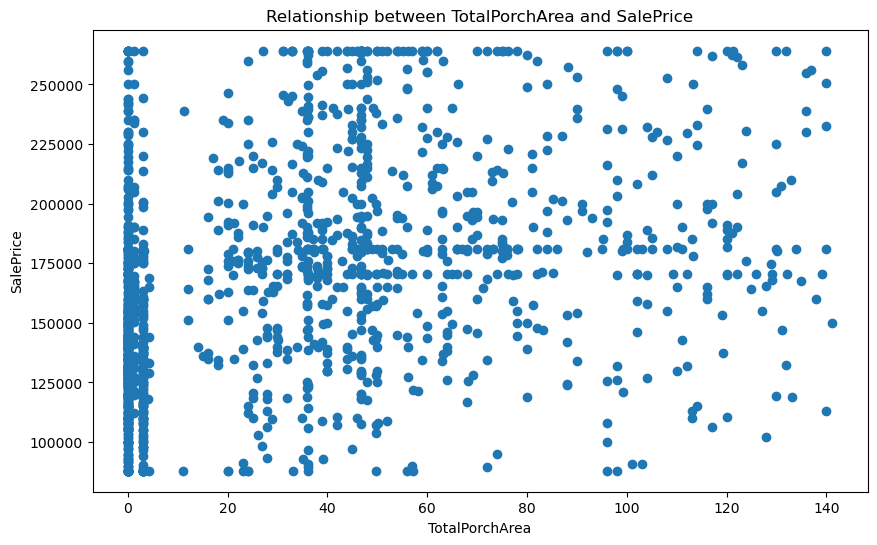

In [1244]:
plt.figure(figsize=(10, 6))
plt.scatter(df['TotalPorchArea'],df['SalePrice'])
plt.xlabel('TotalPorchArea')
plt.ylabel('SalePrice')
plt.title('Relationship between TotalPorchArea and SalePrice')
plt.show()

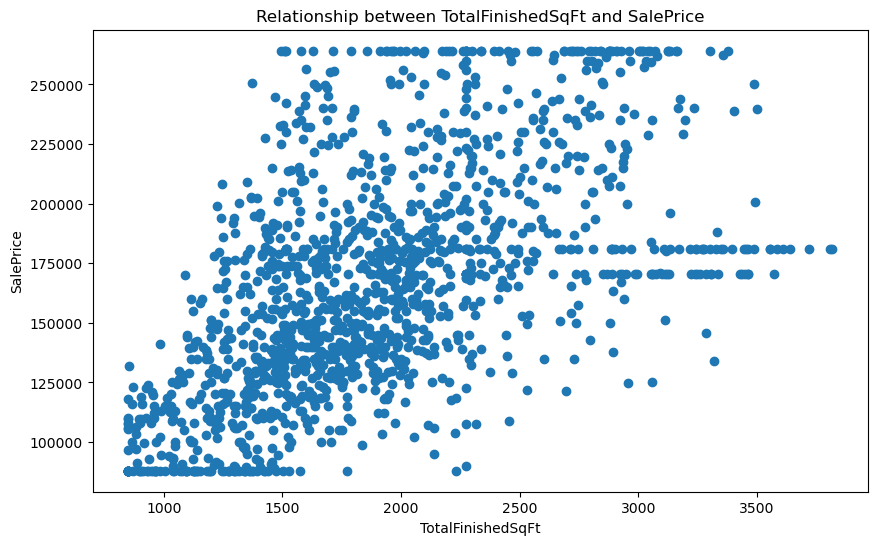

In [1245]:
plt.figure(figsize=(10, 6))
plt.scatter(df['TotalFinishedSqFt'],df['SalePrice'])
plt.xlabel('TotalFinishedSqFt')
plt.ylabel('SalePrice')
plt.title('Relationship between TotalFinishedSqFt and SalePrice')
plt.show()

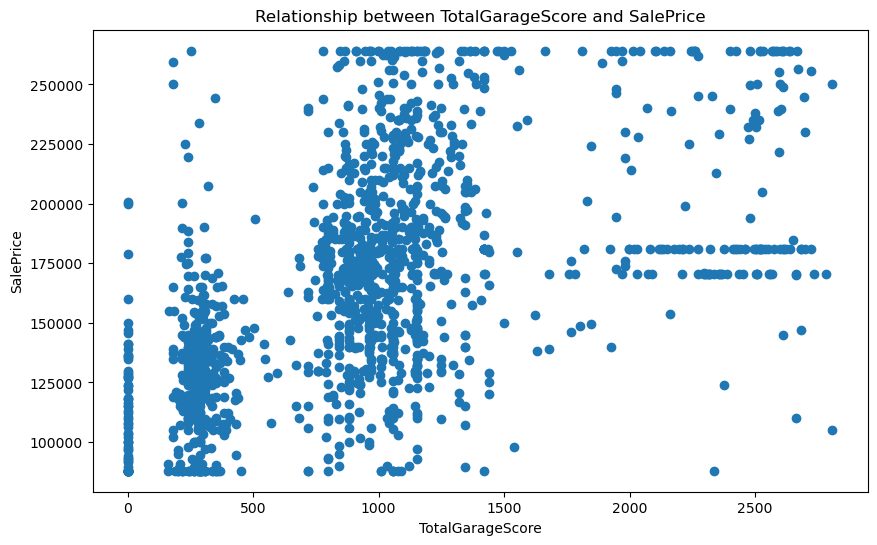

In [1246]:
plt.figure(figsize=(10, 6))
plt.scatter(df['TotalGarageScore'],df['SalePrice'])
plt.xlabel('TotalGarageScore')
plt.ylabel('SalePrice')
plt.title('Relationship between TotalGarageScore and SalePrice')
plt.show()

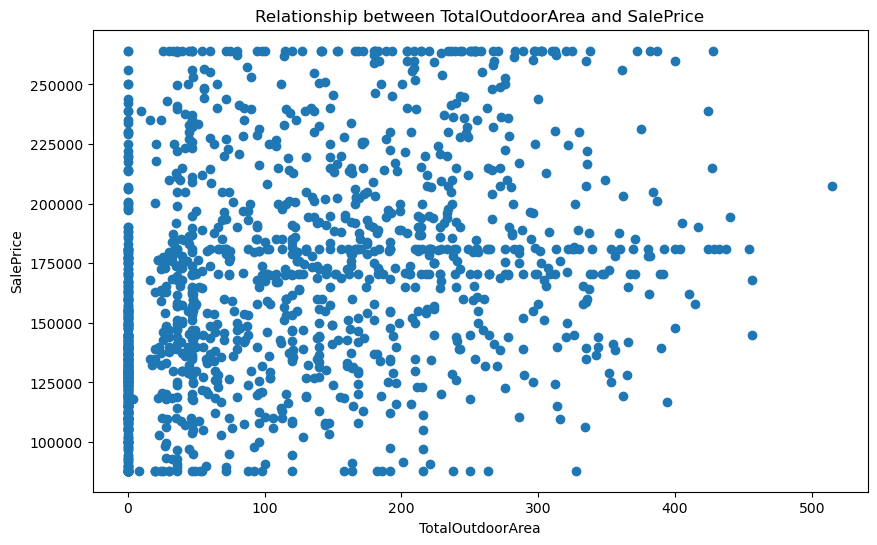

In [1247]:
plt.figure(figsize=(10, 6))
plt.scatter(df['TotalOutdoorArea'],df['SalePrice'])
plt.xlabel('TotalOutdoorArea')
plt.ylabel('SalePrice')
plt.title('Relationship between TotalOutdoorArea and SalePrice')
plt.show()

#### Correlation between Feature Column and Target-Column:

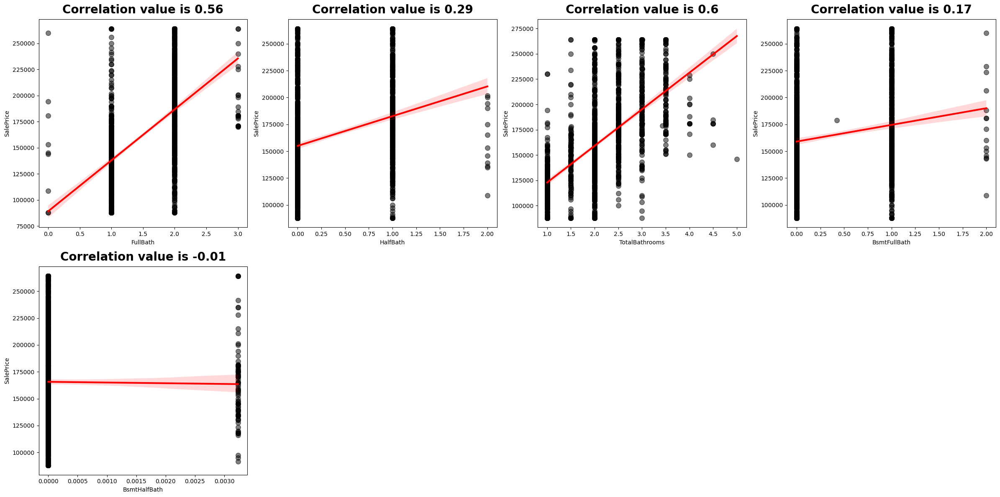

In [1248]:
#Columns related to Bathrooms

cols = ['FullBath', 'HalfBath','TotalBathrooms', 'BsmtFullBath', 'BsmtHalfBath']

plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

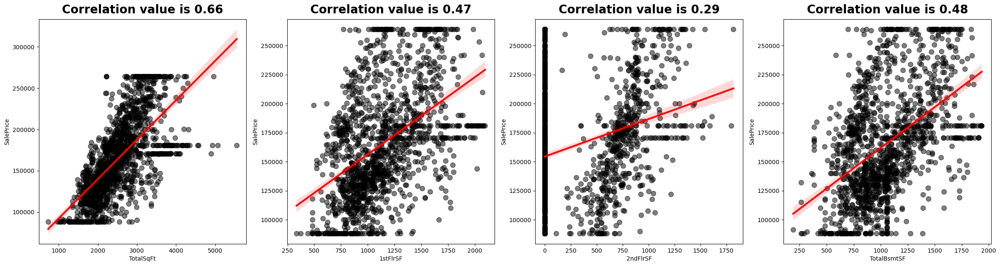

In [1249]:
#columns related to square footage
#finding correlation

cols = ['TotalSqFt', '1stFlrSF','2ndFlrSF', 'TotalBsmtSF']

plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

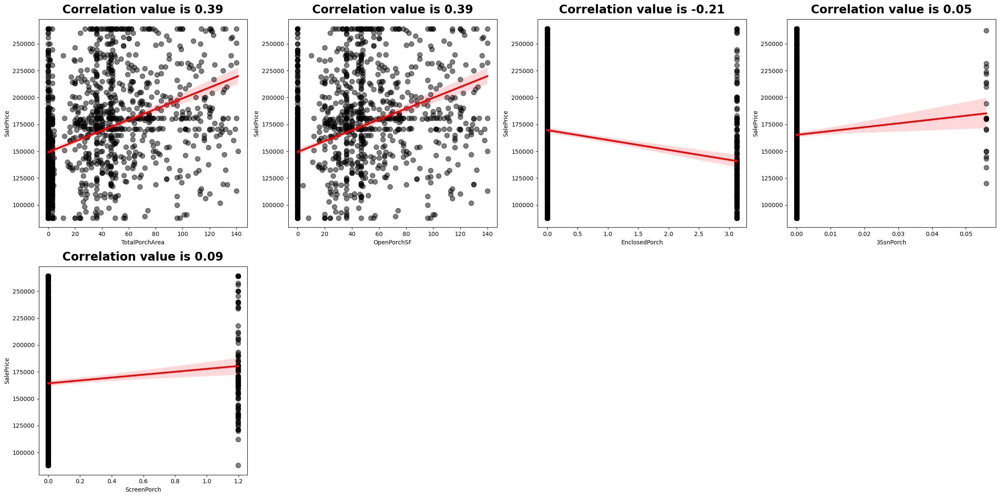

In [1250]:
#columns related to porch
#finding correlation

cols = ['TotalPorchArea', 'OpenPorchSF','EnclosedPorch', '3SsnPorch','ScreenPorch']

plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

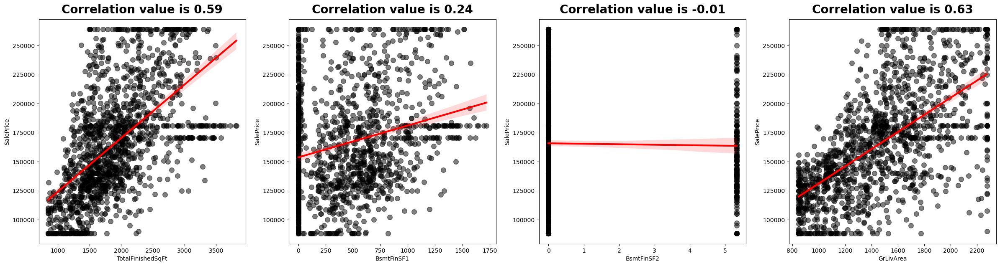

In [1251]:
#columns related to finished area

cols = ['TotalFinishedSqFt', 'BsmtFinSF1','BsmtFinSF2', 'GrLivArea']

plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

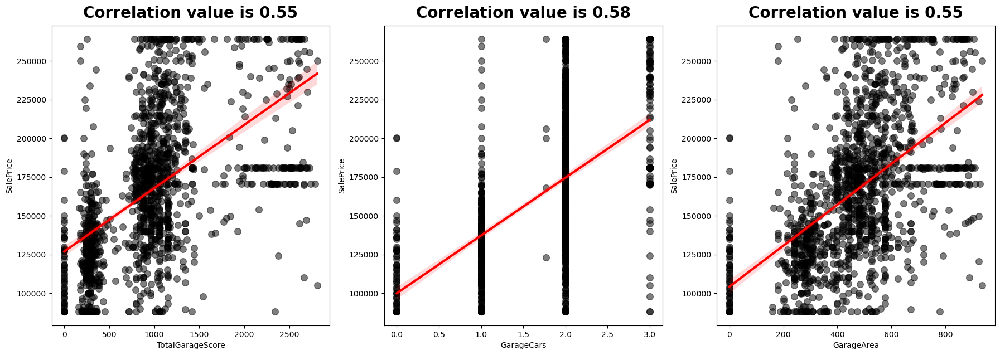

In [1252]:
#columns related to Garage

cols = ['TotalGarageScore', 'GarageCars','GarageArea']
plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

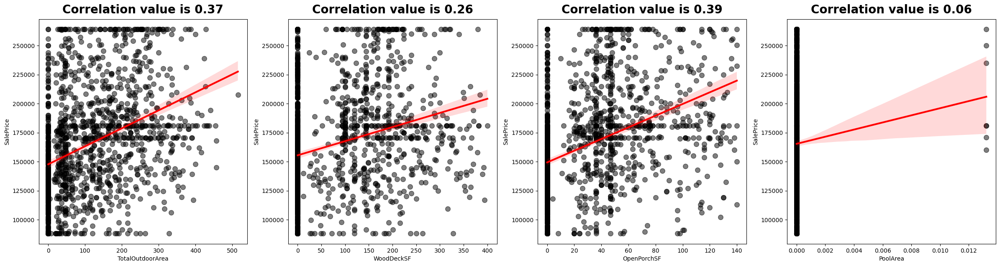

In [1253]:
#column related to total outdoor area

cols = ['TotalOutdoorArea', 'WoodDeckSF','OpenPorchSF','PoolArea']
plt.figure(figsize=(24, 12))
for index, column in enumerate(cols):
    plt.subplot(2, 4, index + 1)
    sns.regplot(x=df[column], y=df["SalePrice"], color="black",
                scatter_kws={'s': 70, 'alpha': 0.5}, line_kws={'color': 'red', 'lw': 3})
    corr = round(df[[column, "SalePrice"]].corr()["SalePrice"][0], 2)
    plt.title(f"Correlation value is {corr}", pad=10, size=20, fontweight="black")
plt.tight_layout()
plt.show()

#### Dropping Features columns with weak correlation:¶

In [1254]:
#Using above correlation analysis we are dropping columns with weak correlation with Sale price 
df.drop(columns=['OpenPorchSF','BsmtFinSF2','BsmtFinSF1','ScreenPorch','3SsnPorch','EnclosedPorch','2ndFlrSF','FullBath',
                 'HalfBath','BsmtFullBath','BsmtHalfBath','YearBuilt'],inplace=True)

In [1255]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,SC60,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,5.0,Gable,CompShg,VinylSd,VinylSd,196.000000,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,0.0,1710.0,3.0,1.0,Gd,8.0,Typ,0.0,No,Attchd,5.0,RFn,2.0,548.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2008.0,WD,Normal,208500.0,81.254871,2003.0,2566.0,3.500000,61.000000,2416.0,12.000000,1096.0,61.0
1,SC20,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,5.575342,31.0,Gable,CompShg,MetalSd,MetalSd,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,1262.0,3.0,1.0,TA,6.0,Typ,1.0,TA,Attchd,31.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,No,No,No,0.0,May,2007.0,WD,Normal,181500.0,71.909667,1976.0,2524.0,2.001616,0.000000,2240.0,11.575342,920.0,298.0
2,SC60,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,6.0,Gable,CompShg,VinylSd,VinylSd,162.000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,0.0,1786.0,3.0,1.0,Gd,6.0,Typ,1.0,TA,Attchd,7.0,RFn,2.0,608.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Sep,2008.0,WD,Normal,223500.0,82.594235,2001.0,2706.0,3.500000,42.000000,2272.0,12.000000,1216.0,42.0
3,SC70,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.000000,36.0,Gable,CompShg,Wd Sdng,Wd Shng,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,0.0,1717.0,3.0,1.0,Gd,7.0,Typ,1.0,Gd,Detchd,8.0,Unf,3.0,642.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2006.0,WD,Abnorml,140000.0,56.611403,1915.0,2473.0,2.000000,38.127709,1933.0,12.000000,1926.0,35.0
4,SC60,RL,84.0,14100.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.000000,8.0,Gable,CompShg,VinylSd,VinylSd,68.765396,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,0.0,2198.0,4.0,1.0,Gd,9.0,Typ,1.0,TA,Attchd,8.0,RFn,3.0,836.0,TA,TA,Y,192.0,0.0,No,No,No,0.0,Dec,2008.0,WD,Normal,250000.0,74.783129,2000.0,3343.0,3.500000,84.000000,2853.0,13.000000,2508.0,276.0


### Numerical Variables
Since the numerical variables are skewed we will perform log normal distribution

In [1256]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,SC60,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,5.0,Gable,CompShg,VinylSd,VinylSd,196.000000,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,0.0,1710.0,3.0,1.0,Gd,8.0,Typ,0.0,No,Attchd,5.0,RFn,2.0,548.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2008.0,WD,Normal,208500.0,81.254871,2003.0,2566.0,3.500000,61.000000,2416.0,12.000000,1096.0,61.0
1,SC20,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,5.575342,31.0,Gable,CompShg,MetalSd,MetalSd,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,1262.0,3.0,1.0,TA,6.0,Typ,1.0,TA,Attchd,31.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,No,No,No,0.0,May,2007.0,WD,Normal,181500.0,71.909667,1976.0,2524.0,2.001616,0.000000,2240.0,11.575342,920.0,298.0
2,SC60,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,6.0,Gable,CompShg,VinylSd,VinylSd,162.000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,0.0,1786.0,3.0,1.0,Gd,6.0,Typ,1.0,TA,Attchd,7.0,RFn,2.0,608.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Sep,2008.0,WD,Normal,223500.0,82.594235,2001.0,2706.0,3.500000,42.000000,2272.0,12.000000,1216.0,42.0
3,SC70,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.000000,36.0,Gable,CompShg,Wd Sdng,Wd Shng,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,0.0,1717.0,3.0,1.0,Gd,7.0,Typ,1.0,Gd,Detchd,8.0,Unf,3.0,642.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2006.0,WD,Abnorml,140000.0,56.611403,1915.0,2473.0,2.000000,38.127709,1933.0,12.000000,1926.0,35.0
4,SC60,RL,84.0,14100.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.000000,8.0,Gable,CompShg,VinylSd,VinylSd,68.765396,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,0.0,2198.0,4.0,1.0,Gd,9.0,Typ,1.0,TA,Attchd,8.0,RFn,3.0,836.0,TA,TA,Y,192.0,0.0,No,No,No,0.0,Dec,2008.0,WD,Normal,250000.0,74.783129,2000.0,3343.0,3.500000,84.000000,2853.0,13.000000,2508.0,276.0


In [1257]:
# list of numerical columns whose data type is not object'o'
num_column=df.select_dtypes(include=['float64','int64','int32']).columns

skewness = df[num_column].skew()

# Print skewness for each numerical column
print(skewness)

LotFrontage          -0.542279
LotArea              -0.158389
OverallQual           0.278625
OverallCond           0.796372
YearRemodAdd          0.502489
MasVnrArea            1.159652
BsmtUnfSF             0.676054
TotalBsmtSF           0.477192
1stFlrSF              0.530655
LowQualFinSF          7.299413
GrLivArea             0.291583
BedroomAbvGr         -0.318393
KitchenAbvGr          4.307849
TotRmsAbvGrd          0.294653
Fireplaces            0.550101
GarageYrBlt           0.703005
GarageCars           -0.423646
GarageArea           -0.163578
WoodDeckSF            0.963409
PoolArea             14.352680
MiscVal               5.016528
YrSold                0.096269
SalePrice             0.398999
PricePerSqFt         -0.092148
AgeAtSale            -0.553051
TotalSqFt             0.517656
TotalBathrooms        0.202756
TotalPorchArea        1.020919
TotalFinishedSqFt     0.613163
TotalQualityScore    -0.245735
TotalGarageScore      0.886201
TotalOutdoorArea      0.796340
dtype: f

#### Observations from Skewness Output:

##### **Highly Right-Skewed Features (Skewness > 2):**
- **LotArea (12.21)**
- **LowQualFinSF (9.01)**
- **MiscVal (24.48)**
- **MasVnrArea (2.68)**
- **TotalPorchArea (2.00)**
- **TotalFinishedSqFt (2.17)**
- **TotalOutdoorArea (1.80)**
- **SalePrice (1.88)**

These features have extreme values on the right, indicating the presence of outliers. These variables may need special attention or transformations to mitigate the impact of outliers.

##### **Moderately Right-Skewed Features (Skewness between 0.5 and 2):**
- **TotalBsmtSF (1.52)**
- **1stFlrSF (1.38)**
- **GrLivArea (1.37)**
- **TotalSqFt (1.78)**
- **TotalGarageScore (1.24)**

These distributions are slightly asymmetric and might benefit from log transformation to reduce skewness and improve model performance.

##### **Near-Normal Features (Skewness between -0.5 and 0.5):**
- **LotFrontage (0.27)**
- **OverallQual (0.22)**
- **Fireplaces (0.65)**
- **GarageYrBlt (0.64)**
- **GarageArea (0.18)**
- **TotalBathrooms (0.26)**

These features are approximately symmetric and don’t require any transformation. They are already well-suited for analysis without further adjustments.

##### **Negatively Skewed Features (Skewness < -0.5):**
- **GarageCars (-0.34)**
- **AgeAtSale (-0.61)**
- **TotalQualityScore (-0.42)**

These features might require inverse or square transformations to normalize and make the data more symmetric for modeling.


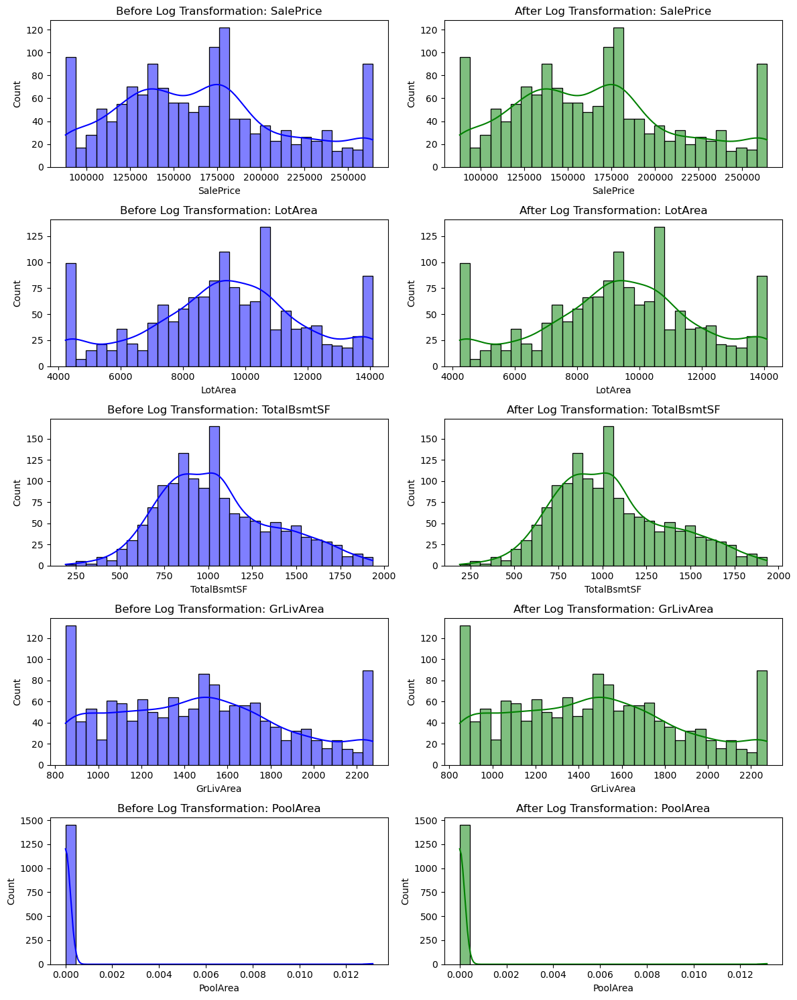

In [1258]:
# Select highly skewed numerical features (absolute skewness > 1)
skewed_features = skewness[abs(skewness) > 1].index

# Apply log transformation (adding 1 to avoid log(0) issues)
df_log_transformed = df
df_log_transformed[skewed_features] = df_log_transformed[skewed_features].apply(lambda x: np.log1p(x))

# Plot histograms before and after transformation for selected features
selected_features = ["SalePrice", "LotArea", "TotalBsmtSF", "GrLivArea", "PoolArea"]

fig, axes = plt.subplots(len(selected_features), 2, figsize=(12, 15))

for i, feature in enumerate(selected_features):
    # Original distribution
    sns.histplot(df[feature], bins=30, kde=True, ax=axes[i, 0], color='blue')
    axes[i, 0].set_title(f"Before Log Transformation: {feature}")
    
    # Transformed distribution
    sns.histplot(df_log_transformed[feature], bins=30, kde=True, ax=axes[i, 1], color='green')
    axes[i, 1].set_title(f"After Log Transformation: {feature}")

plt.tight_layout()
plt.show()


### Observations from the Log Transformations:

#### **Before Transformation (Blue Histograms):**
- The distributions are heavily right-skewed, meaning a small number of high values are pulling the average up.
- Features like **LotArea**, **TotalBsmtSF**, **GrLivArea**, **PoolArea**, and **SalePrice** have a long tail on the right, indicating that these features are highly skewed.

#### **After Log Transformation (Green Histograms):**
- The distributions become more normal (bell-shaped), suggesting that the transformation has normalized the data.
- The extreme skewness is reduced, making these features more suitable for machine learning models that assume normality in the data.
- Log transformation compresses large values while maintaining the order of the data, making it easier for algorithms to model relationships more effectively.



In [1259]:
df.shape


(1460, 75)

In [1318]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,9,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,5.0,1,1,12,13,5.283204,2,4,2,2,4,3,2,6,150.0,856.0,1,0,1,5,856.0,0.0,1710.0,3.0,0.693147,2,8.0,6,0.0,3,1,5.0,2,2.0,548.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,2008-01-01,8,4,208500.0,81.254871,2003.0,0.380617,0.625000,4.127134,2416.000000,12.000000,1096.0,61.000000
1,4,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,5.575342,31.0,1,1,8,8,0.000000,3,4,1,2,4,1,0,6,284.0,1262.0,1,0,1,5,1262.0,0.0,1262.0,3.0,0.693147,3,6.0,6,1.0,5,1,31.0,2,2.0,460.0,5,5,2,298.000000,0.0,3,4,1,0.000000,8,2007-01-01,8,4,181500.0,71.909667,1976.0,0.371920,0.250404,0.000000,2240.000000,11.575342,920.0,298.000000
2,9,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.000000,6.0,1,1,12,13,5.093750,2,4,2,2,4,2,2,6,434.0,920.0,1,0,1,5,920.0,0.0,1786.0,3.0,0.693147,2,6.0,6,1.0,5,1,7.0,2,2.0,608.0,5,5,2,0.000000,0.0,3,4,1,0.000000,11,2008-01-01,8,4,223500.0,82.594235,2001.0,0.409609,0.625000,3.761200,2272.000000,12.000000,1216.0,42.000000
3,10,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.000000,36.0,1,1,13,15,0.000000,3,4,0,4,1,3,0,6,540.0,756.0,1,2,1,5,961.0,0.0,1717.0,3.0,0.693147,2,7.0,6,1.0,2,5,8.0,3,3.0,642.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,2006-01-01,8,0,140000.0,56.611403,1915.0,0.361358,0.250000,3.666831,1933.000000,12.000000,1926.0,35.000000
4,9,3,84.0,14100.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.000000,8.0,1,1,12,13,4.245138,2,4,2,2,4,0,2,6,490.0,1145.0,1,0,1,5,1145.0,0.0,2198.0,4.0,0.693147,2,9.0,6,1.0,5,1,8.0,2,3.0,836.0,5,5,2,192.000000,0.0,3,4,1,0.000000,2,2008-01-01,8,4,250000.0,74.783129,2000.0,0.541520,0.625000,4.442651,2853.000000,13.000000,2508.0,276.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,9,3,62.0,7917.0,1,3,3,0,4,0,8,2,2,0,5,6.0,5.000000,7.0,1,1,12,13,0.000000,3,4,2,2,4,3,6,6,953.0,953.0,1,0,1,5,953.0,0.0,1647.0,3.0,0.693147,3,7.0,6,1.0,5,1,8.0,2,2.0,460.0,5,5,2,0.000000,0.0,3,4,1,0.000000,1,2007-01-01,8,4,175000.0,67.307692,1999.0,0.387658,0.375000,3.713572,1647.000000,11.000000,920.0,40.000000
1456,4,3,85.0,13175.0,1,3,3,0,4,0,14,2,2,0,2,6.0,6.000000,22.0,1,1,9,10,4.787492,3,4,1,2,4,3,0,5,589.0,1542.0,1,4,1,5,2073.0,0.0,2073.0,3.0,0.693147,3,7.0,2,2.0,5,1,32.0,3,2.0,500.0,5,5,2,349.000000,0.0,3,2,1,0.000000,3,2010-01-01,8,4,210000.0,58.091286,1978.0,0.597846,0.500000,0.000000,2868.324476,12.000000,1000.0,349.000000
1457,10,3,66.0,9042.0,1,3,3,0,4,0,6,2,2,0,5,7.0,5.575342,4.0,1,1,5,5,0.000000,0,2,4,4,1,3,2,6,877.0,1152.0,1,0,1,5,1188.0,0.0,2274.0,4.0,0.693147,2,9.0,6,2.0,2,1,69.0,2,1.0,252.0,5,5,2,0.000000,0.0,3,0,3,0.935672,8,2010-01-01,8,4,264132.0,77.096322,1941.0,0.572375,0.250000,4.110874,2549.000000,12.575342,252.0,60.000000
1458,4,3,68.0,9717.0,1,3,3,0,4,0,12,2,2,0,2,5.0,6.000000,14.0,3,1,8,8,0.000000,3,4,1,4,4,2,2,5,0.0,1078.0,1,2,1,0,1078.0,0.0,1078.0,2.0,0.693147,2,5.0,6,0.0,3,1,60.0,3,1.0,240.0,5,5,2,366.000000,0.0,3,4,1,0.000000,0,2010-01-01,8,4,142125.0,65.920686,1950.0,0.295713,0.250000,1.417722,1132.32

#### Scatter-plot:

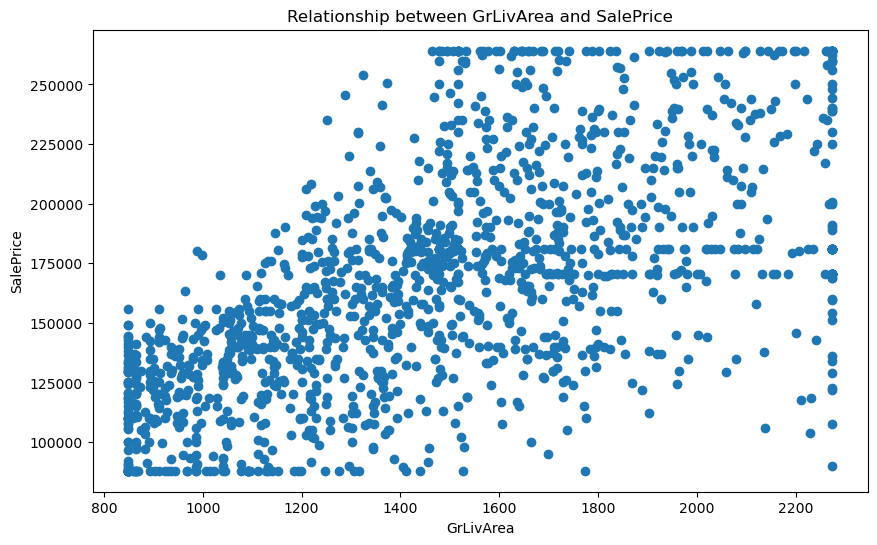

In [1260]:
plt.figure(figsize=(10, 6))
plt.scatter(df['GrLivArea'],df['SalePrice'])
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')
plt.title('Relationship between GrLivArea and SalePrice')
plt.show()

#### Line Plot

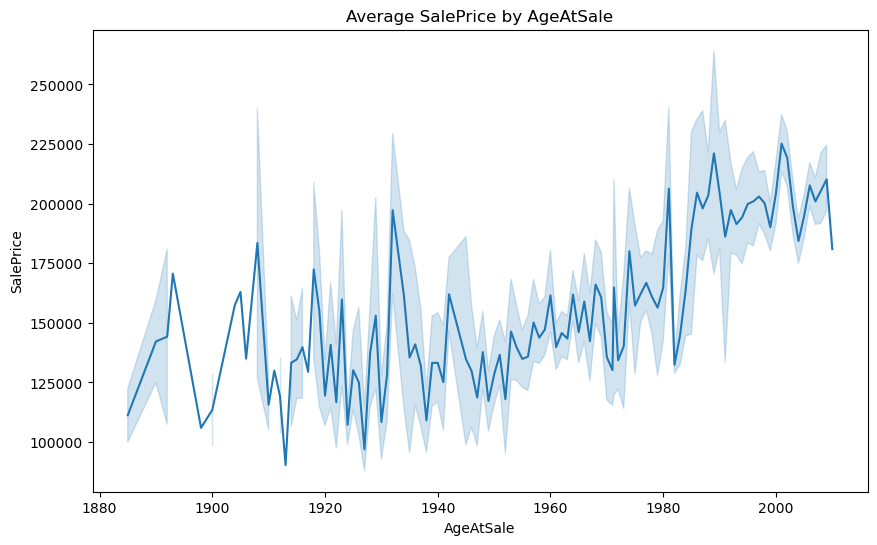

In [1261]:
#Relationship of age of the property with the sale price

plt.figure(figsize=(10, 6))
sns.lineplot(x='AgeAtSale', y='SalePrice', data=df)
plt.xlabel('AgeAtSale')
plt.ylabel('SalePrice')
plt.title('Average SalePrice by AgeAtSale')
plt.show()

#### Box-plot:

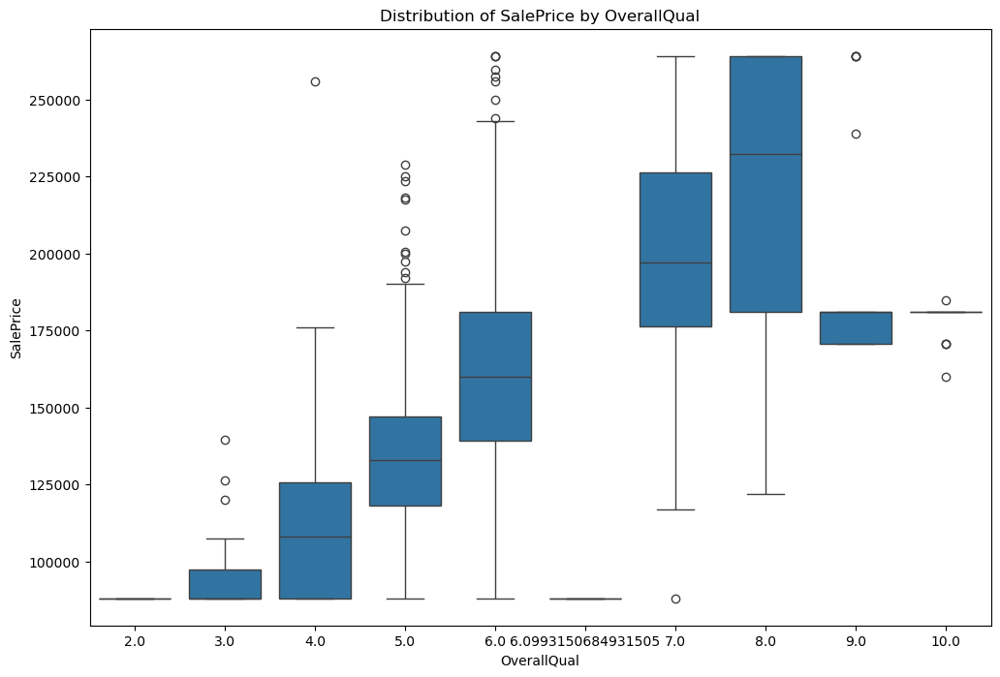

In [1262]:
#Distribution of SalePrice by OverallQual

plt.figure(figsize=(12, 8))
sns.boxplot(x='OverallQual', y='SalePrice', data=df)
plt.xlabel('OverallQual')
plt.ylabel('SalePrice')
plt.title('Distribution of SalePrice by OverallQual')
plt.show()

Here are a few key observations from this boxplot:

General Trend: The boxplot will help identify how SalePrice changes as OverallQual increases. If there's a clear upward trend in the median (the line inside each box), it would suggest that properties with higher quality generally sell for more.

Distribution Shape:

You might observe that for lower values of OverallQual, there may be a wider spread in the SalePrice, indicating that low-quality homes can vary significantly in price.

For higher OverallQual values, the SalePrice could be more concentrated around a higher median, showing that high-quality homes tend to be priced similarly in a certain range.

Outliers: Look for any potential outliers (data points that are far from the upper or lower "whiskers"). Outliers could indicate properties that are unusually priced (either far too cheap or too expensive) compared to the typical pricing for a given quality level.

Spread of Data: The length of the box (the interquartile range) and the whiskers (showing the range of data) will give you an idea of the variability in sale prices for different quality levels. You may notice that higher OverallQual ratings tend to have smaller ranges of sale prices, as properties of high quality could be more uniform in terms of pricing.

#### Histogram:

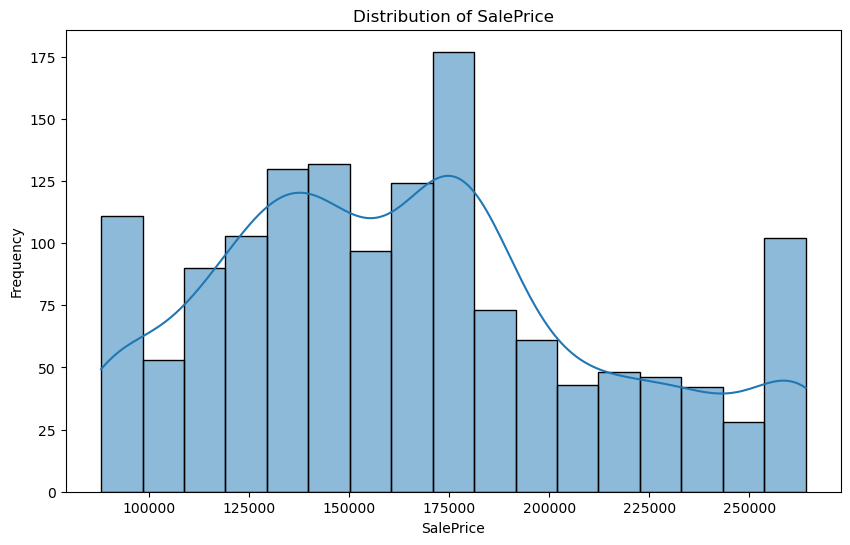

In [1263]:
plt.figure(figsize=(10, 6))
sns.histplot(df['SalePrice'], kde=True)
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.title('Distribution of SalePrice')
plt.show()

The histogram will reveal how SalePrice is distributed.
The distribution is normal.
The KDE curve helps visualize the overall shape of the distribution.


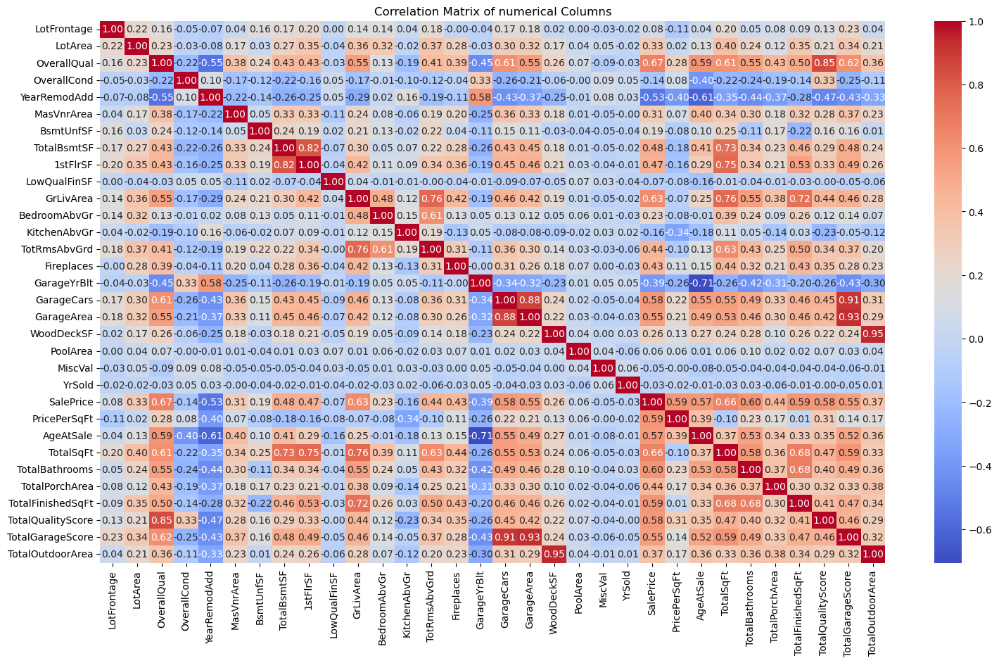

In [1264]:
# finding the correlation of numerical columns
corr = df[num_column].corr()
plt.figure(figsize=(18, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of numerical Columns')
plt.show()

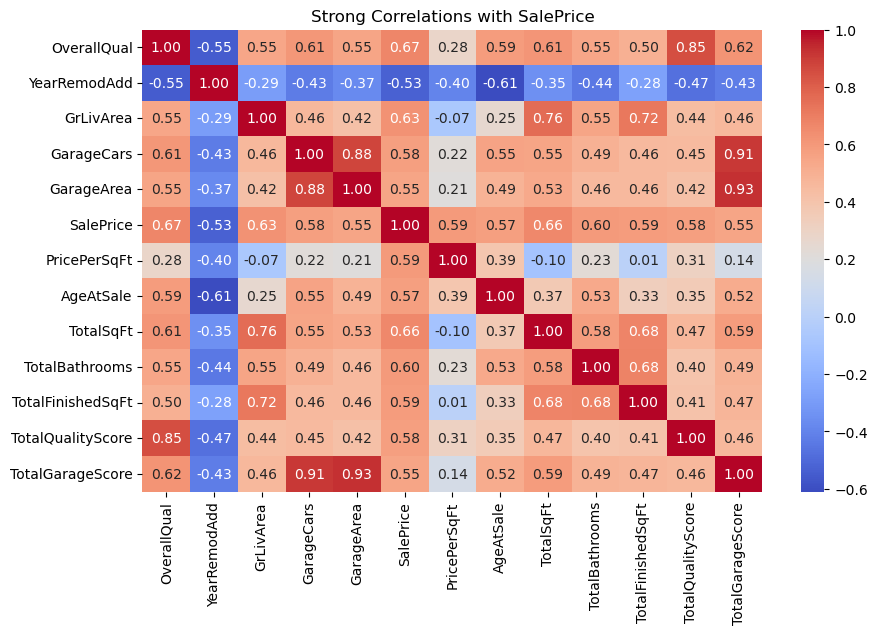

In [1265]:
#finding out the columns which have strong correlation with the salr price

numeric_df = df[num_column]
correlation_matrix = numeric_df.corr()
if 'SalePrice' in correlation_matrix.columns:
    strong_corr = correlation_matrix[abs(correlation_matrix['SalePrice']) > 0.5]['SalePrice']
    valid_features = strong_corr.index.intersection(numeric_df.columns)
    if len(valid_features) > 1:
        plt.figure(figsize=(10, 6))
        sns.heatmap(numeric_df[valid_features].corr(), annot=True, cmap='coolwarm', fmt='.2f')
        plt.title('Strong Correlations with SalePrice')
        plt.show()
    else:
        print("No strongly correlated features found.")
else:
    print("SalePrice column is missing in the dataset.")

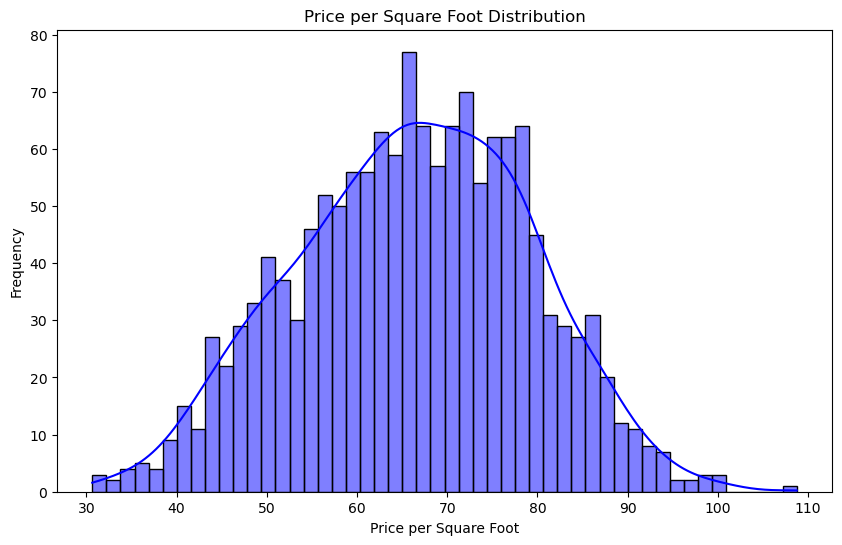

In [1266]:
#visualize the distribution of the PricePerSqFt column
plt.figure(figsize=(10, 6))
sns.histplot(df['PricePerSqFt'], bins=50, kde=True, color='blue')
plt.title('Price per Square Foot Distribution')
plt.xlabel('Price per Square Foot')
plt.ylabel('Frequency')
plt.show()

#### Pair- plot

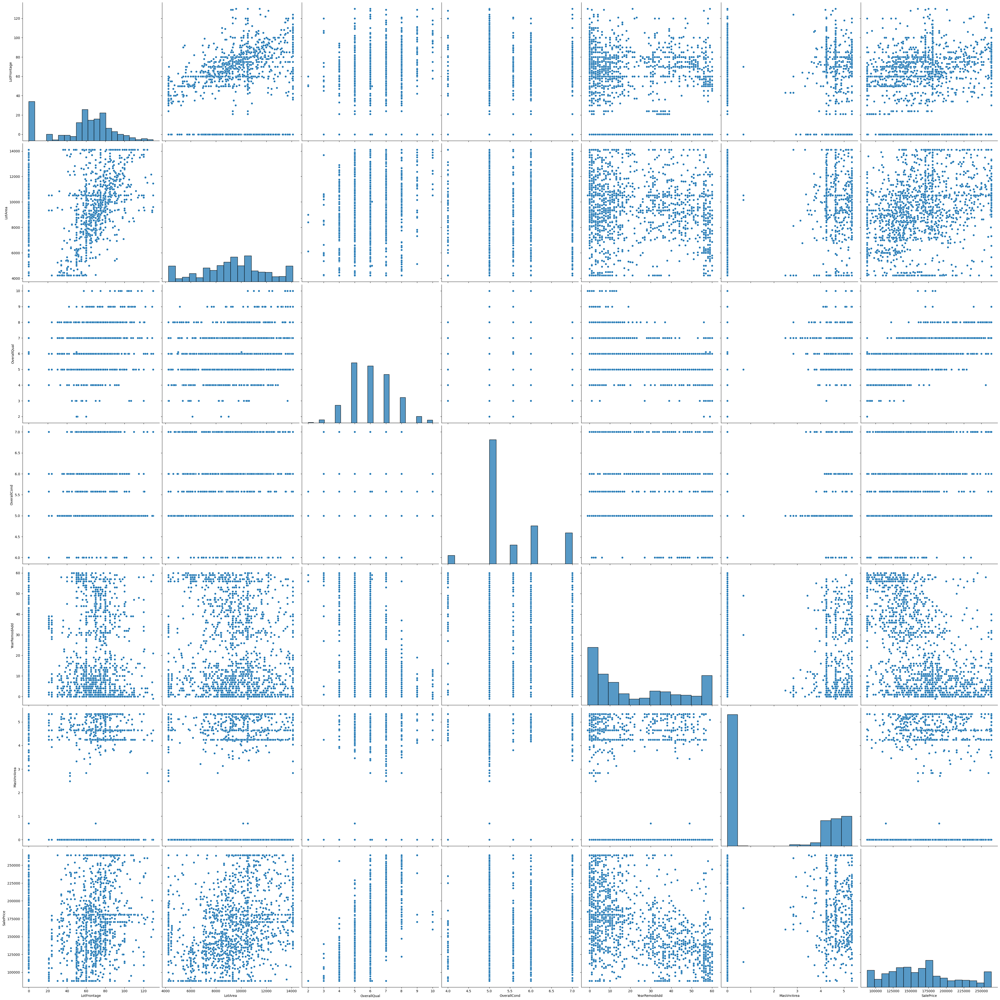

In [1267]:
exclude_housing_data=df.select_dtypes(exclude=['object'])

sns.pairplot(exclude_housing_data[['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond','YearRemodAdd', 'MasVnrArea','SalePrice']], height=6)
plt.show()

#### Encoding:

In [1268]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,SC60,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,5.0,Gable,CompShg,VinylSd,VinylSd,5.283204,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,0.0,1710.0,3.0,0.693147,Gd,8.0,Typ,0.0,No,Attchd,5.0,RFn,2.0,548.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2008.0,WD,Normal,208500.0,81.254871,2003.0,2566.0,3.500000,4.127134,2416.0,12.000000,1096.0,61.0
1,SC20,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,5.575342,31.0,Gable,CompShg,MetalSd,MetalSd,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,1262.0,3.0,0.693147,TA,6.0,Typ,1.0,TA,Attchd,31.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,No,No,No,0.0,May,2007.0,WD,Normal,181500.0,71.909667,1976.0,2524.0,2.001616,0.000000,2240.0,11.575342,920.0,298.0
2,SC60,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.000000,6.0,Gable,CompShg,VinylSd,VinylSd,5.093750,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,0.0,1786.0,3.0,0.693147,Gd,6.0,Typ,1.0,TA,Attchd,7.0,RFn,2.0,608.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Sep,2008.0,WD,Normal,223500.0,82.594235,2001.0,2706.0,3.500000,3.761200,2272.0,12.000000,1216.0,42.0
3,SC70,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.000000,36.0,Gable,CompShg,Wd Sdng,Wd Shng,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,0.0,1717.0,3.0,0.693147,Gd,7.0,Typ,1.0,Gd,Detchd,8.0,Unf,3.0,642.0,TA,TA,Y,0.0,0.0,No,No,No,0.0,Feb,2006.0,WD,Abnorml,140000.0,56.611403,1915.0,2473.0,2.000000,3.666831,1933.0,12.000000,1926.0,35.0
4,SC60,RL,84.0,14100.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.000000,8.0,Gable,CompShg,VinylSd,VinylSd,4.245138,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,0.0,2198.0,4.0,0.693147,Gd,9.0,Typ,1.0,TA,Attchd,8.0,RFn,3.0,836.0,TA,TA,Y,192.0,0.0,No,No,No,0.0,Dec,2008.0,WD,Normal,250000.0,74.783129,2000.0,3343.0,3.500000,4.442651,2853.0,13.000000,2508.0,276.0


In [1269]:
df.shape

(1460, 75)

In [1270]:
df.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
1455,SC60,RL,62.0,7917.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6.0,5.000000,7.0,Gable,CompShg,VinylSd,VinylSd,0.000000,TA,TA,PConc,Gd,TA,No,Unf,Unf,953.0,953.0,GasA,Ex,Y,SBrkr,953.0,0.0,1647.0,3.0,0.693147,TA,7.0,Typ,1.0,TA,Attchd,8.0,RFn,2.0,460.0,TA,TA,Y,0.000000,0.0,No,No,No,0.000000,Aug,2007.0,WD,Normal,175000.0,67.307692,1999.0,2600.0,2.5,3.713572,1647.000000,11.000000,920.0,40.000000
1456,SC20,RL,85.0,13175.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6.0,6.000000,22.0,Gable,CompShg,Plywood,Plywood,4.787492,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,589.0,1542.0,GasA,TA,Y,SBrkr,2073.0,0.0,2073.0,3.0,0.693147,TA,7.0,Min1,2.0,TA,Attchd,32.0,Unf,2.0,500.0,TA,TA,Y,349.000000,0.0,No,MnPrv,No,0.000000,Feb,2010.0,WD,Normal,210000.0,58.091286,1978.0,3615.0,3.0,0.000000,2868.324476,12.000000,1000.0,349.000000
1457,SC70,RL,66.0,9042.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.575342,4.0,Gable,CompShg,CemntBd,CmentBd,0.000000,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,877.0,1152.0,GasA,Ex,Y,SBrkr,1188.0,0.0,2274.0,4.0,0.693147,Gd,9.0,Typ,2.0,Gd,Attchd,69.0,RFn,1.0,252.0,TA,TA,Y,0.000000,0.0,No,GdPrv,Shed,0.935672,May,2010.0,WD,Normal,264132.0,77.096322,1941.0,3492.0,2.0,4.110874,2549.000000,12.575342,252.0,60.000000
1458,SC20,RL,68.0,9717.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5.0,6.000000,14.0,Hip,CompShg,MetalSd,MetalSd,0.000000,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,0.0,1078.0,GasA,Gd,Y,FuseA,1078.0,0.0,1078.0,2.0,0.693147,Gd,5.0,Typ,0.0,No,Attchd,60.0,Unf,1.0,240.0,TA,TA,Y,366.000000,0.0,No,No,No,0.000000,Apr,2010.0,WD,Normal,142125.0,65.920686,1950.0,2156.0,2.0,1.417722,1132.324476,11.000000,240.0,366.000000
1459,SC20,RL,75.0,9937.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5.0,6.000000,43.0,Gable,CompShg,HdBoard,HdBoard,0.000000,Gd,TA,CBlock,TA,TA,No,BLQ,LwQ,136.0,1256.0,GasA,Gd,Y,SBrkr,1256.0,0.0,1256.0,3.0,0.693147,TA,6.0,Typ,0.0,No,Attchd,43.0,Fin,1.0,276.0,TA,TA,Y,94.244521,0.0,No,No,No,0.000000,Jun,2008.0,WD,Normal,147500.0,58.718153,1965.0,2512.0,2.5,4.234107,2091.324476,11.000000,276.0,162.244521


In [1271]:
cat_features

Index(['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [1272]:
from sklearn.preprocessing import LabelEncoder
for col in cat_features:
    df[col] = LabelEncoder().fit_transform((df[col]).round(2))

In [1273]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,9,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,5.0,1,1,12,13,5.283204,2,4,2,2,4,3,2,6,150.0,856.0,1,0,1,5,856.0,0.0,1710.0,3.0,0.693147,2,8.0,6,0.0,3,1,5.0,2,2.0,548.0,5,5,2,0.0,0.0,3,4,1,0.0,3,2008.0,8,4,208500.0,81.254871,2003.0,2566.0,3.500000,4.127134,2416.0,12.000000,1096.0,61.0
1,4,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,5.575342,31.0,1,1,8,8,0.000000,3,4,1,2,4,1,0,6,284.0,1262.0,1,0,1,5,1262.0,0.0,1262.0,3.0,0.693147,3,6.0,6,1.0,5,1,31.0,2,2.0,460.0,5,5,2,298.0,0.0,3,4,1,0.0,8,2007.0,8,4,181500.0,71.909667,1976.0,2524.0,2.001616,0.000000,2240.0,11.575342,920.0,298.0
2,9,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.000000,6.0,1,1,12,13,5.093750,2,4,2,2,4,2,2,6,434.0,920.0,1,0,1,5,920.0,0.0,1786.0,3.0,0.693147,2,6.0,6,1.0,5,1,7.0,2,2.0,608.0,5,5,2,0.0,0.0,3,4,1,0.0,11,2008.0,8,4,223500.0,82.594235,2001.0,2706.0,3.500000,3.761200,2272.0,12.000000,1216.0,42.0
3,10,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.000000,36.0,1,1,13,15,0.000000,3,4,0,4,1,3,0,6,540.0,756.0,1,2,1,5,961.0,0.0,1717.0,3.0,0.693147,2,7.0,6,1.0,2,5,8.0,3,3.0,642.0,5,5,2,0.0,0.0,3,4,1,0.0,3,2006.0,8,0,140000.0,56.611403,1915.0,2473.0,2.000000,3.666831,1933.0,12.000000,1926.0,35.0
4,9,3,84.0,14100.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.000000,8.0,1,1,12,13,4.245138,2,4,2,2,4,0,2,6,490.0,1145.0,1,0,1,5,1145.0,0.0,2198.0,4.0,0.693147,2,9.0,6,1.0,5,1,8.0,2,3.0,836.0,5,5,2,192.0,0.0,3,4,1,0.0,2,2008.0,8,4,250000.0,74.783129,2000.0,3343.0,3.500000,4.442651,2853.0,13.000000,2508.0,276.0


In [1274]:
#Total Square column:
df['TotalSqFt']

0       2566.0
1       2524.0
2       2706.0
3       2473.0
4       3343.0
         ...  
1455    2600.0
1456    3615.0
1457    3492.0
1458    2156.0
1459    2512.0
Name: TotalSqFt, Length: 1460, dtype: float64

In [1275]:
df['TotalBathrooms']

0       3.500000
1       2.001616
2       3.500000
3       2.000000
4       3.500000
          ...   
1455    2.500000
1456    3.000000
1457    2.000000
1458    2.000000
1459    2.500000
Name: TotalBathrooms, Length: 1460, dtype: float64

#### Feature Scaling:

#### Normalize Numerical Features:

In [1276]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df[['TotalSqFt', 'TotalBathrooms']] = scaler.fit_transform(df[['TotalSqFt', 'TotalBathrooms']])

In [1277]:
df[['TotalSqFt', 'TotalBathrooms']]

,TotalSqFt,TotalBathrooms
0,0.380617,0.625000
1,0.371920,0.250404
2,0.409609,0.625000
3,0.361358,0.250000
4,0.541520,0.625000
...,...,...
1455,0.387658,0.375000
1456,0.597846,0.500000
1457,0.572375,0.250000
1458,0.295713,0.250000


#### Correlation Analysis:

In [1278]:
correlation_matrix = df.corr()

In [1279]:
correlation_with_saleprice = correlation_matrix['SalePrice'].sort_values(ascending=False)

In [1280]:
correlation_matrix.round(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
MSSubClass,1.00,0.02,0.13,0.26,-0.02,-0.07,-0.05,-0.02,-0.08,-0.00,-0.01,0.01,0.03,-0.43,0.43,-0.01,0.04,0.11,-0.09,0.04,0.03,0.04,-0.07,0.10,-0.04,-0.07,0.09,-0.07,-0.05,0.13,-0.00,-0.06,-0.19,0.09,0.08,-0.09,-0.03,-0.10,0.05,0.32,0.44,0.28,0.07,0.41,0.03,0.06,0.10,0.13,0.13,0.04,0.02,0.03,-0.07,-0.07,-0.06,0.00,0.06,-0.05,-0.09,0.03,0.03,0.01,-0.02,0.08,-0.05,0.06,-0.03,-0.16,0.17,0.13,-0.02,0.13,0.01,0.04,0.01
MSZoning,0.02,1.00,-0.06,-0.06,0.09,0.06,-0.02,-0.00,-0.01,-0.02,-0.25,-0.03,0.04,0.01,-0.11,-0.16,0.15,0.17,-0.00,0.01,-0.01,0.01,-0.04,0.20,-0.10,-0.24,0.16,-0.01,0.04,0.03,-0.03,-0.04,-0.11,0.06,0.13,-0.05,-0.07,-0.06,-0.01,-0.11,-0.03,0.04,0.13,-0.05,-0.10,-0.01,-0.00,0.14,0.25,0.12,-0.17,-0.17,-0.16,-0.10,-0.10,-0.02,-0.00,0.00,-0.06,-0.01,-0.00,0.01,-0.02,0.10,0.01,-0.25,-0.20,-0.30,-0.12,-0.19,-0.16,-0.11,-0.07,-0.16,-0.07
LotFrontage,0.13,-0.06,1.00,0.22,-0.03,0.20,-0.01,-0.05,0.06,-0.08,0.09,-0.04,-0.02,-0.24,-0.04,0.16,-0.05,-0.07,0.13,0.00,0.09,0.09,0.04,-0.14,0.04,0.03,-0.12,-0.00,-0.04,0.09,0.02,0.16,0.17,-0.01,-0.09,-0.02,0.01,0.20,0.00,0.14,0.14,0.04,-0.14,0.18,0.02,-0.00,-0.11,-0.08,-0.04,-0.06,0.17,0.18,-0.01,0.02,0.02,0.02,0.00,-0.01,-0.01,-0.01,-0.03,0.01,-0.02,-0.05,0.06,0.08,-0.11,0.04,0.20,0.05,0.08,0.09,0.13,0.23,0.04
LotArea,0.26,-0.06,0.22,1.00,-0.02,-0.27,0.03,0.05,-0.17,0.04,0.09,0.08,0.01,-0.44,0.11,0.23,-0.03,-0.08,0.14,0.06,0.03,0.03,0.17,-0.14,0.05,0.06,-0.13,0.02,-0.14,-0.05,-0.04,0.03,0.27,-0.03,-0.04,0.11,0.08,0.35,-0.04,0.36,0.32,-0.02,-0.15,0.37,0.02,0.28,0.02,-0.26,-0.03,-0.09,0.30,0.32,0.12,0.11,0.11,0.17,0.04,-0.04,-0.01,0.04,0.05,0.02,-0.02,-0.03,0.06,0.33,0.02,0.13,0.40,0.24,0.12,0.35,0.21,0.34,0.21
Street,-0.02,0.09,-0.03,-0.02,1.00,-0.01,0.12,0.00,0.01,-0.18,-0.01,-0.07,0.00,-0.02,0.02,0.06,0.05,-0.07,-0.02,0.01,0.00,0.01,0.01,0.05,0.01,0.04,-0.03,-0.02,0.07,-0.01,0.06,0.03,0.01,0.01,-0.05,0.07,0.02,0.00,0.01,0.05,0.03,0.01,-0.03,0.05,-0.02,-0.01,-0.00,-0.02,-0.02,0.00,-0.02,0.02,0.00,0.01,0.02,0.03,0.00,-0.00,-0.03,-0.16,-0.16,0.00,-0.03,0.01,0.01,0.04,0.02,0.02,0.03,0.01,0.02,0.02,0.09,-0.00,0.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TotalPorchArea,-0.02,-0.16,0.08,0.12,0.02,-0.12,0.06,0.03,-0.03,-0.03,0.14,0.08,0.01,-0.02,0.16,0.43,-0.19,-0.37,-0.01,0.02,0.15,0.13,0.18,-0.36,0.08,0.27,-0.36,0.05,-0.07,0.03,0.12,0.17,0.23,-0.05,-0.31,0.09,0.14,0.21,-0.01,0.38,0.09,-0.14,-0.30,0.25,0.07,0.21,0.01,-0.24,-0.31,-0.27,0.33,0.30,0.09,0.12,0.07,0.10,0.02,-0.02,0.10,-0.03,-0.04,0.00,-0.06,-0.02,0.12,0.44,0.17,0.34,0.36,0.37,1.00,0.30,0.32,0.33,0.38
TotalFinishedSqFt,0.13,-0.11,0.09,0.35,0.02,-0.20,0.00,-0.02,-0.05,0.12,0.18,0.07,-0.01,-0.06,0.18,0.50,-0.14,-0.28,0.18,0.07,0.01,0.00,0.32,-0.33,0.08,0.23,-0.36,0.08,-0.21,-0.35,0.08,-0.22,0.46,-0.06,-0.19,0.17,0.20,0.53,-0.03,0.72,0.26,0.03,-0.32,0.50,-0.01,0.43,0.04,-0.38,-0.20,-0.30,0.46,0.46,0.19,0.20,0.19,0.26,0.02,-0.03,0.07,-0.04,-0.04,0.02,-0.01,-

### Insights

#### **Strong Positive Correlations:**

- **TotalFinishedSqFt and GrLivArea (0.72):** These two variables are strongly positively correlated. This means that as the finished square footage increases, the living area tends to increase as well.
  
- **TotalQualityScore and GrLivArea (0.85):** The quality score of a house is highly correlated with the ground living area, suggesting that larger houses tend to have higher quality ratings.
  
- **GarageScore and TotalGarageScore (0.91):** As expected, the garage score is highly correlated with the total garage score, meaning houses with higher garage quality tend to have higher overall garage scores.

#### **Moderate Correlations:**

- **LotArea and TotalSqFt (0.36):** There is a moderate positive correlation between lot area and total square footage, indicating that larger lots may have larger homes, but this isn't a perfect relationship.
  
- **PricePerSqFt and SalePrice (0.85):** The price per square foot has a strong positive correlation with the sale price, which is expected—larger or higher-quality homes generally cost more.
  
- **TotalBathrooms and TotalFinishedSqFt (0.46):** There is a moderate positive correlation between the number of bathrooms and the total finished square footage, indicating that larger homes tend to have more bathrooms.

#### **Negative Correlations:**

- **OverallQual and LotFrontage (-0.24):** There is a slight negative correlation between the overall quality of the home and the lot frontage, suggesting that higher-quality homes may not necessarily have larger frontages.
  
- **BsmtQual and BsmtExposure (-0.49):** Basement quality has a moderately negative correlation with basement exposure, meaning that basements with better quality might be less exposed, possibly due to being more enclosed or finished.
  
- **Condition1 and AgeAtSale (-0.47):** Older homes tend to have a worse condition at sale, which may indicate that older homes are more likely to be in need of renovation or upkeep.

#### **Low Correlations:**

- **MSZoning and TotalOutdoorArea (0.02):** There is a very weak positive correlation, suggesting no significant relationship between zoning type and outdoor area.
  
- **YearRemodAdd and TotalPorchArea (-0.03):** There is a weak negative correlation between the year of remodel and porch area, which could suggest that homes that were remodeled recently tend to have less porch space.


#### Model Building:

In [1281]:
X=df.drop('SalePrice',axis=1)
Y=df.SalePrice

In [1282]:
X

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,9,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,5.0,1,1,12,13,5.283204,2,4,2,2,4,3,2,6,150.0,856.0,1,0,1,5,856.0,0.0,1710.0,3.0,0.693147,2,8.0,6,0.0,3,1,5.0,2,2.0,548.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,2008.0,8,4,81.254871,2003.0,0.380617,0.625000,4.127134,2416.000000,12.000000,1096.0,61.000000
1,4,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,5.575342,31.0,1,1,8,8,0.000000,3,4,1,2,4,1,0,6,284.0,1262.0,1,0,1,5,1262.0,0.0,1262.0,3.0,0.693147,3,6.0,6,1.0,5,1,31.0,2,2.0,460.0,5,5,2,298.000000,0.0,3,4,1,0.000000,8,2007.0,8,4,71.909667,1976.0,0.371920,0.250404,0.000000,2240.000000,11.575342,920.0,298.000000
2,9,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.000000,6.0,1,1,12,13,5.093750,2,4,2,2,4,2,2,6,434.0,920.0,1,0,1,5,920.0,0.0,1786.0,3.0,0.693147,2,6.0,6,1.0,5,1,7.0,2,2.0,608.0,5,5,2,0.000000,0.0,3,4,1,0.000000,11,2008.0,8,4,82.594235,2001.0,0.409609,0.625000,3.761200,2272.000000,12.000000,1216.0,42.000000
3,10,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.000000,36.0,1,1,13,15,0.000000,3,4,0,4,1,3,0,6,540.0,756.0,1,2,1,5,961.0,0.0,1717.0,3.0,0.693147,2,7.0,6,1.0,2,5,8.0,3,3.0,642.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,2006.0,8,0,56.611403,1915.0,0.361358,0.250000,3.666831,1933.000000,12.000000,1926.0,35.000000
4,9,3,84.0,14100.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.000000,8.0,1,1,12,13,4.245138,2,4,2,2,4,0,2,6,490.0,1145.0,1,0,1,5,1145.0,0.0,2198.0,4.0,0.693147,2,9.0,6,1.0,5,1,8.0,2,3.0,836.0,5,5,2,192.000000,0.0,3,4,1,0.000000,2,2008.0,8,4,74.783129,2000.0,0.541520,0.625000,4.442651,2853.000000,13.000000,2508.0,276.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,9,3,62.0,7917.0,1,3,3,0,4,0,8,2,2,0,5,6.0,5.000000,7.0,1,1,12,13,0.000000,3,4,2,2,4,3,6,6,953.0,953.0,1,0,1,5,953.0,0.0,1647.0,3.0,0.693147,3,7.0,6,1.0,5,1,8.0,2,2.0,460.0,5,5,2,0.000000,0.0,3,4,1,0.000000,1,2007.0,8,4,67.307692,1999.0,0.387658,0.375000,3.713572,1647.000000,11.000000,920.0,40.000000
1456,4,3,85.0,13175.0,1,3,3,0,4,0,14,2,2,0,2,6.0,6.000000,22.0,1,1,9,10,4.787492,3,4,1,2,4,3,0,5,589.0,1542.0,1,4,1,5,2073.0,0.0,2073.0,3.0,0.693147,3,7.0,2,2.0,5,1,32.0,3,2.0,500.0,5,5,2,349.000000,0.0,3,2,1,0.000000,3,2010.0,8,4,58.091286,1978.0,0.597846,0.500000,0.000000,2868.324476,12.000000,1000.0,349.000000
1457,10,3,66.0,9042.0,1,3,3,0,4,0,6,2,2,0,5,7.0,5.575342,4.0,1,1,5,5,0.000000,0,2,4,4,1,3,2,6,877.0,1152.0,1,0,1,5,1188.0,0.0,2274.0,4.0,0.693147,2,9.0,6,2.0,2,1,69.0,2,1.0,252.0,5,5,2,0.000000,0.0,3,0,3,0.935672,8,2010.0,8,4,77.096322,1941.0,0.572375,0.250000,4.110874,2549.000000,12.575342,252.0,60.000000
1458,4,3,68.0,9717.0,1,3,3,0,4,0,12,2,2,0,2,5.0,6.000000,14.0,3,1,8,8,0.000000,3,4,1,4,4,2,2,5,0.0,1078.0,1,2,1,0,1078.0,0.0,1078.0,2.0,0.693147,2,5.0,6,0.0,3,1,60.0,3,1.0,240.0,5,5,2,366.000000,0.0,3,4,1,0.000000,0,2010.0,8,4,65.920686,1950.0,0.295713,0.250000,1.417722,1132.324476,11.000000,240.0,366.000000


In [1283]:
Y

0       208500.0
1       181500.0
2       223500.0
3       140000.0
4       250000.0
          ...   
1455    175000.0
1456    210000.0
1457    264132.0
1458    142125.0
1459    147500.0
Name: SalePrice, Length: 1460, dtype: float64

In [1284]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [1285]:
X_test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
892,4,3,70.0,8414.0,1,3,3,0,4,0,19,2,2,0,2,6.0,5.575342,3.0,3,1,6,6,0.000000,3,4,1,4,4,3,2,6,396.0,1059.0,1,4,1,5,1068.0,0.0,1068.0,3.0,0.693147,3,6.0,6,0.0,3,1,43.0,2,1.0,264.0,5,5,2,192.0,0.0,3,2,1,0.0,3,2006.0,8,4,72.637518,1963.0,0.289708,0.000404,0.000000,1731.0,11.575342,264.0,192.0
1105,9,3,98.0,12256.0,1,0,3,0,0,0,15,2,2,0,5,8.0,5.000000,15.0,1,1,6,6,4.245138,2,4,2,0,4,0,2,6,431.0,1463.0,1,0,1,5,1500.0,0.0,2274.0,3.0,0.693147,2,9.0,6,2.0,5,1,16.0,2,2.0,712.0,5,5,2,186.0,0.0,3,4,1,0.0,0,2010.0,8,4,45.673941,1994.0,0.695175,0.625000,3.496508,3306.0,13.000000,1424.0,218.0
413,5,4,56.0,8960.0,1,3,3,0,4,0,17,0,2,0,2,5.0,6.000000,60.0,1,1,14,15,0.000000,3,4,1,4,4,3,6,6,1008.0,1008.0,1,2,1,0,1028.0,0.0,1028.0,2.0,0.693147,3,5.0,6,1.0,2,5,83.0,3,2.0,360.0,5,5,2,0.0,0.0,3,4,1,0.0,7,2010.0,8,4,56.483301,1927.0,0.270864,0.000000,1.417722,1028.0,11.000000,720.0,0.0
522,8,4,50.0,5000.0,1,3,3,0,0,0,3,1,2,0,0,6.0,7.000000,56.0,1,1,5,5,0.000000,3,2,1,4,4,3,0,6,605.0,1004.0,1,0,1,5,1004.0,0.0,1664.0,3.0,0.693147,3,7.0,6,2.0,2,5,56.0,3,2.0,420.0,5,5,2,0.0,0.0,3,4,1,0.0,10,2006.0,8,4,59.595202,1947.0,0.401739,0.250000,3.336755,2063.0,13.000000,840.0,24.0
1036,4,3,89.0,12898.0,1,0,1,0,4,0,23,2,2,0,2,9.0,5.000000,1.0,3,1,12,13,4.262680,2,4,2,0,4,1,2,6,598.0,1620.0,1,0,1,5,1620.0,0.0,1620.0,2.0,0.693147,0,6.0,6,1.0,0,1,1.0,0,3.0,912.0,5,5,2,228.0,0.0,3,4,1,0.0,11,2009.0,8,4,52.680098,2007.0,0.520191,0.500000,0.000000,2642.0,14.000000,2736.0,228.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,5,4,50.0,5925.0,1,3,0,0,4,0,17,2,2,0,2,4.0,7.000000,7.0,3,1,11,12,4.645516,3,4,0,1,4,3,5,6,739.0,907.0,1,4,1,5,1131.0,0.0,1131.0,2.0,0.693147,3,7.0,6,0.0,3,5,12.0,3,2.0,672.0,5,5,2,0.0,0.0,3,2,1,0.0,7,2007.0,8,2,43.901374,1937.0,0.271278,0.000000,4.290459,1299.0,11.000000,1344.0,72.0
1361,4,3,124.0,14100.0,1,0,2,0,4,1,22,2,2,0,2,7.0,5.000000,4.0,3,1,12,13,2.833213,2,4,2,0,4,0,0,6,256.0,1530.0,1,0,1,5,1530.0,0.0,1530.0,3.0,0.693147,2,7.0,6,1.0,2,1,4.0,0,2.0,430.0,5,5,2,168.0,0.0,3,4,1,0.0,6,2009.0,8,4,84.967320,2005.0,0.482916,0.500000,3.610918,2804.0,12.000000,860.0,204.0
802,9,3,63.0,8199.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,3.0,1,1,14,15,0.000000,2,4,2,2,4,0,2,6,80.0,728.0,1,0,1,5,728.0,0.0,1456.0,3.0,0.693147,2,7.0,6,1.0,2,1,3.0,0,2.0,410.0,5,5,2,36.0,0.0,3,4,1,0.0,10,2008.0,8,4,86.538462,2005.0,0.301512,0.625000,2.944439,2104.0,12.000000,820.0,54.0
651,10,3,60.0,9084.0,1,3,3,0,4,0,7,0,2,0,5,4.0,5.000000,59.0,1,1,8,8,0.000000,3,4,1,4,4,2,6,6,755.0,755.0,1,4,1,5,755.0,0.0,1510.0,4.0,0.693147,3,7.0,6,1.0,2,5,69.0,3,1.0,296.0,1,4,1,120.0,0.0,3,2,1,0.0,10,2009.0,8,4,47.682119,1940.0,0.318285,0.250000,0.000000,1510.0,9.000000,296.0,120.0


In [1286]:
Y_train

254     145000.0
1066    178000.0
638      88000.0
799     175000.0
380     127000.0
          ...   
1095    176432.0
1130    135000.0
1294    115000.0
860     189950.0
1126    174000.0
Name: SalePrice, Length: 1168, dtype: float64

In [1287]:
Y_test

892     154500.000000
1105    170683.516404
413     115000.000000
522     159000.000000
1036    170683.516404
            ...      
479      89471.000000
1361    260000.000000
802     189000.000000
651     108000.000000
722     124500.000000
Name: SalePrice, Length: 292, dtype: float64

### Applying different models

#### Creating Decision Tree Regressor Model:

In [1288]:
from sklearn.tree import DecisionTreeRegressor
model4 = DecisionTreeRegressor(random_state=42)
model4.fit(X_train, Y_train)



DecisionTreeRegressor(random_state=42)

In [1289]:
DT_pred = model4.predict(X_test)

score = model4.score(X_test, Y_test)
print(f'Model Score: {score}')

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print('Mean Absolute Error:', mae)

Model Score: 0.9353317924971156
Mean Squared Error: 73077158.2539194
R-squared: 0.9699583297782025
Mean Absolute Error: 6173.116816767057


#### Creating Random Forest Regressor Model:

In [1290]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()

In [1291]:
model.fit(X_train,Y_train)

RandomForestRegressor()

In [1292]:
y_pred = model.predict(X_test)

In [1293]:
y_pred

array([152865.5       , 171425.45087564, 111181.08      , 160292.        ,
       177967.19545499,  88849.        , 169744.86424588, 148142.34      ,
        88338.5       , 134649.        , 148452.60516404, 130820.        ,
        94311.        , 213645.15      , 179194.62587671, 133444.        ,
       183382.98587671, 135053.25      , 115178.12      , 231546.48      ,
       156024.50549211, 205150.53      , 174522.95      , 127085.9       ,
       194116.67104075, 155202.01      , 181771.9719589 , 137634.        ,
       179819.85      , 208865.39      , 131590.32      , 256870.58      ,
       198946.47887637, 134510.7       , 252407.14      , 142596.5       ,
       141033.00516404, 220321.81      , 175569.33249123,  97464.5       ,
        97955.        , 209333.67391781, 118457.5       , 254233.75587671,
       129994.1       , 115592.41516404, 116914.        , 124669.        ,
       176132.29061903, 142986.87      , 123319.5       , 201093.63104075,
       126531.34      , 2

In [1294]:
score = model.score(X_test, Y_test)
print(f'Model Score: {score}')

Model Score: 0.9843679279156614


In [1295]:
from sklearn.metrics import mean_squared_error, r2_score

In [1296]:
mse = mean_squared_error(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)
mae = mean_absolute_error(Y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print('Mean Absolute Error:', mae)

Mean Squared Error: 38025429.24910431
R-squared: 0.9843679279156614
Mean Absolute Error: 3575.527906173058


#### Creating Linear-Regression Model

In [1297]:
from sklearn.linear_model import LinearRegression

In [1298]:
model2 = LinearRegression()

In [1299]:
model2.fit(X_train,Y_train)

LinearRegression()

In [1300]:
Y_pred = model2.predict(X_test)

In [1301]:
score = model2.score(X_test, Y_test)
print(f'Model Score: {score}')

Model Score: 0.9702601103863545


In [1302]:
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)
mae = mean_absolute_error(Y_test, Y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print('Mean Absolute Error:', mae)

Mean Squared Error: 72343068.93408221
R-squared: 0.9702601103863545
Mean Absolute Error: 6093.886328133179


#### Lasso Regression

In [1303]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [1304]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005, random_state=0)) # remember to set the seed, the random state in this function
feature_sel_model.fit(X_train, Y_train)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [1305]:
feature_sel_model.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

In [1306]:
lasso = Lasso(alpha=0.01)  # Example alpha value, adjust based on your needs
lasso.fit(X_train, Y_train)

# Use SelectFromModel for feature selection
feature_sel_model = SelectFromModel(lasso, threshold="mean", max_features=10)
X_train_selected = feature_sel_model.transform(X_train)

# List selected features
selected_feat = X_train.columns[feature_sel_model.get_support()]

# Print some stats
print('Total features: {}'.format(X_train.shape[1]))  # Total features in the data
print('Selected features: {}'.format(len(selected_feat)))  # Number of selected features

# Now print how many coefficients are zero
print('Features with coefficients shrank to zero: {}'.format(np.sum(lasso.coef_ == 0))) 

Total features: 74
Selected features: 2
Features with coefficients shrank to zero: 0


In [1307]:
model3 = Lasso()

# Train the model
model3.fit(X_train, Y_train)

# Predicting values using the trained model
model3_pred = model3.predict(X_test)

# Displaying the predicted values
print('Predicted values (model3_pred):', model3_pred)

Predicted values (model3_pred): [157816.55310987 190562.31623781 110675.05808814 160538.12664713
 171105.51277189  82413.82667305 168457.27577063 144820.8633632
  81473.14640992 137891.65237122 146051.33574811 140785.08034348
  69958.97293481 212570.81642692 182561.13789546 134848.55868348
 182140.94920114 133297.42618918 119357.18003095 222171.31362651
 154570.72975307 213507.73308111 176365.89751256 130293.00833339
 190362.02244348 151544.1983163  179085.14023671 158036.32324038
 180155.75858047 204806.91407984 130785.50362445 254309.03656589
 208566.19681189 141070.83623446 247117.06548596 139573.83567097
 150993.29944154 217739.08182131 186157.55368669  90469.45451412
 107195.49205337 200418.21992331 118700.80511903 243043.2678889
 124891.79249502 138852.43055186 116476.59052578 127873.96046507
 202439.30398997 146257.18386145 120789.59378399 199712.26733284
 123831.30397822 259264.43514507 159051.28961525 251940.57135592
 214796.79931423 183020.41475115  92831.57018907 100253.9332

In [1308]:
# Calculate and print the Mean Squared Error
mse = mean_squared_error(Y_test, model3_pred)
print('Mean Squared Error:', mse)

# Calculate and print the R-squared score
r2 = r2_score(Y_test, model3_pred)
print('R-squared:', r2)

mae = mean_absolute_error(Y_test, model3_pred)
print('Mean Absolute Error:', mae)


Mean Squared Error: 72751955.95165665
R-squared: 0.970092018889183
Mean Absolute Error: 6152.559024364576


#### Support Vector Machine (SVM) regression:

In [1365]:
from sklearn.svm import SVR

model5= SVR()

# Train SVM Regressor
model5 = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
model5.fit(X_train, y_train)



SVR(C=100, gamma=0.1)

In [1364]:
# Predicting
model5_pred = model5.predict(X_test)

# Evaluating model performance

# Calculate and print the Mean Squared Error
mse = mean_squared_error(Y_test, model5_pred)
print('Mean Squared Error:', mse)

# Calculate and print the R-squared score
r2 = r2_score(Y_test, model5_pred)
print('R-squared:', r2)

mae = mean_absolute_error(Y_test, model5_pred)
print('Mean Absolute Error:', mae)


Mean Squared Error: 2439348851.786013
R-squared: -0.0028046452852523718
Mean Absolute Error: 40760.73588627234


#### Comparing the MAE, MSE and RMSE of the models for final selection of model:


In [1366]:
models = ['Random Forest','Linear Regression', 'Lasso','Decision Tree','SVR']
mae_values = [3575.527906173058, 3575.527906173058, 6152.559024364576,6173.116816767057,40760.73588627234]
rmse_values = [ 0.9843679279156614, 0.9843679279156614,0.970092018889183,0.9699583297782025,-0.0028046452852523718]
mse_values=[38025429.24910431,72343068.93408221,72751955.95165665,73077158.2539194,2439348851.786013]
model_comparison = pd.DataFrame({'Model': models,'MAE': mae_values,'RMSE': rmse_values,'MSE':mse_values})
print(model_comparison)
best_model = model_comparison.loc[model_comparison['MAE'].idxmin()] #idxmin() finds the index of the minimum MAE value.
print("  ")
print("  ")
print("Best Model based on MAE and RMSE:")
print(best_model)

               Model           MAE      RMSE           MSE
0      Random Forest   3575.527906  0.984368  3.802543e+07
1  Linear Regression   3575.527906  0.984368  7.234307e+07
2              Lasso   6152.559024  0.970092  7.275196e+07
3      Decision Tree   6173.116817  0.969958  7.307716e+07
4                SVR  40760.735886 -0.002805  2.439349e+09
  
  
Best Model based on MAE and RMSE:
Model      Random Forest
MAE          3575.527906
RMSE            0.984368
MSE      38025429.249104
Name: 0, dtype: object


## **Model Comparison Insights**

### **Overview of Models and Metrics**

The models are evaluated using **MAE** (Mean Absolute Error), **RMSE** (Root Mean Squared Error), and **MSE** (Mean Squared Error). Here's a summary of the results:

| **Model**            | **MAE**       | **RMSE**      | **MSE**        |
|----------------------|---------------|---------------|----------------|
| **Random Forest**     | 3575.53       | 0.9844        | 3.80e+07       |
| **Linear Regression** | 3575.53       | 0.9844        | 7.23e+07       |
| **Lasso**             | 6152.56       | 0.9701        | 7.28e+07       |
| **Decision Tree**     | 6173.12       | 0.9700        | 7.31e+07       |
| **SVR**               | 40760.74      | -0.0028       | 2.44e+09       |

---

### **Key Insights**

#### **1. Random Forest - The Top Performer**
- **MAE**: 3575.53  
- **RMSE**: 0.9844  
- **MSE**: 3.80e+07  

**Insight**:  
- **Random Forest** stands out as the best model based on **MAE**, **RMSE**, and **MSE**. It minimizes errors effectively, showing good generalization and stability.  
- The low **MSE** indicates minimal prediction variance, and the low **MAE** suggests that the model makes predictions that are close to the actual values on average.

---

#### **2. Linear Regression - Close, But Slightly Less Precise**
- **MAE**: 3575.53  
- **RMSE**: 0.9844  
- **MSE**: 7.23e+07  

**Insight**:  
- **Linear Regression** matches **Random Forest** in **MAE** and **RMSE**, but its **MSE** is slightly higher.  
- This indicates that while **Linear Regression** is effective for making predictions, it doesn't capture the data's complexity as well as **Random Forest**, leading to larger prediction errors in squared terms (**MSE**).

---

#### **3. Lasso and Decision Tree - Moderate Performance**

- **Lasso**:  
  - **MAE**: 6152.56  
  - **RMSE**: 0.9701  
  - **MSE**: 7.28e+07  

- **Decision Tree**:  
  - **MAE**: 6173.12  
  - **RMSE**: 0.9700  
  - **MSE**: 7.31e+07  

**Insight**:  
- Both **Lasso** and **Decision Tree** models show **higher MAE** and **RMSE** than **Random Forest** and **Linear Regression**, indicating larger prediction errors.  
- **MSE** values are similar between these two models, but they are still larger than the best models (**Random Forest** and **Linear Regression**), suggesting that they are less effective in minimizing prediction errors.

---

#### **4. SVR - The Outlier**
- **MAE**: 40760.74  
- **RMSE**: -0.0028 (Negative value suggests an issue)  
- **MSE**: 2.44e+09  

**Insight**:  
- The **SVR** model performs extremely poorly with **high MAE**, **negative RMSE** (which indicates a calculation anomaly), and an extraordinarily large **MSE**.  
- This suggests that **SVR** either overfits or is a poor choice for this data. It might require better tuning or a different kernel to perform well, but as it stands, it should be discarded in favor of better models.

---

### **Conclusion & Recommendation**

- **Best Model**: **Random Forest**  
  - **Reason**: It has the best performance across all metrics, making it the most reliable model for predictions.  

- **Second Best**: **Linear Regression**  
  - **Reason**: It has similar performance to **Random Forest** but with slightly higher **MSE**.  

- **Avoid**: **SVR**  
  - **Reason**: The **SVR** model performs very poorly and is not suitable for this task without major adjustments.


#### After Selection Running Model:

In [1326]:
datetime_columns = df.select_dtypes(include=['datetime64']).columns

for col in datetime_columns:
    df[col] = pd.to_datetime(df[col])  # Ensure it's datetime type if not already
    df[f'{col}_year'] = df[col].dt.year
    df[f'{col}_month'] = df[col].dt.month
    df[f'{col}_day'] = df[col].dt.day
    df = df.drop(columns=[col])  

# Now continue with splitting data and model training
X = df.drop(columns=["SalePrice"])
Y = df["SalePrice"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [1349]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea,YrSold_year,YrSold_month,YrSold_day
0,9,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,5.0,1,1,12,13,5.283204,2,4,2,2,4,3,2,6,150.0,856.0,1,0,1,5,856.0,0.0,1710.0,3.0,0.693147,2,8.0,6,0.0,3,1,5.0,2,2.0,548.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,8,4,208500.0,81.254871,2003.0,0.380617,0.625000,4.127134,2416.000000,12.000000,1096.0,61.000000,2008,1,1
1,4,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,5.575342,31.0,1,1,8,8,0.000000,3,4,1,2,4,1,0,6,284.0,1262.0,1,0,1,5,1262.0,0.0,1262.0,3.0,0.693147,3,6.0,6,1.0,5,1,31.0,2,2.0,460.0,5,5,2,298.000000,0.0,3,4,1,0.000000,8,8,4,181500.0,71.909667,1976.0,0.371920,0.250404,0.000000,2240.000000,11.575342,920.0,298.000000,2007,1,1
2,9,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.000000,6.0,1,1,12,13,5.093750,2,4,2,2,4,2,2,6,434.0,920.0,1,0,1,5,920.0,0.0,1786.0,3.0,0.693147,2,6.0,6,1.0,5,1,7.0,2,2.0,608.0,5,5,2,0.000000,0.0,3,4,1,0.000000,11,8,4,223500.0,82.594235,2001.0,0.409609,0.625000,3.761200,2272.000000,12.000000,1216.0,42.000000,2008,1,1
3,10,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.000000,36.0,1,1,13,15,0.000000,3,4,0,4,1,3,0,6,540.0,756.0,1,2,1,5,961.0,0.0,1717.0,3.0,0.693147,2,7.0,6,1.0,2,5,8.0,3,3.0,642.0,5,5,2,0.000000,0.0,3,4,1,0.000000,3,8,0,140000.0,56.611403,1915.0,0.361358,0.250000,3.666831,1933.000000,12.000000,1926.0,35.000000,2006,1,1
4,9,3,84.0,14100.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.000000,8.0,1,1,12,13,4.245138,2,4,2,2,4,0,2,6,490.0,1145.0,1,0,1,5,1145.0,0.0,2198.0,4.0,0.693147,2,9.0,6,1.0,5,1,8.0,2,3.0,836.0,5,5,2,192.000000,0.0,3,4,1,0.000000,2,8,4,250000.0,74.783129,2000.0,0.541520,0.625000,4.442651,2853.000000,13.000000,2508.0,276.000000,2008,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,9,3,62.0,7917.0,1,3,3,0,4,0,8,2,2,0,5,6.0,5.000000,7.0,1,1,12,13,0.000000,3,4,2,2,4,3,6,6,953.0,953.0,1,0,1,5,953.0,0.0,1647.0,3.0,0.693147,3,7.0,6,1.0,5,1,8.0,2,2.0,460.0,5,5,2,0.000000,0.0,3,4,1,0.000000,1,8,4,175000.0,67.307692,1999.0,0.387658,0.375000,3.713572,1647.000000,11.000000,920.0,40.000000,2007,1,1
1456,4,3,85.0,13175.0,1,3,3,0,4,0,14,2,2,0,2,6.0,6.000000,22.0,1,1,9,10,4.787492,3,4,1,2,4,3,0,5,589.0,1542.0,1,4,1,5,2073.0,0.0,2073.0,3.0,0.693147,3,7.0,2,2.0,5,1,32.0,3,2.0,500.0,5,5,2,349.000000,0.0,3,2,1,0.000000,3,8,4,210000.0,58.091286,1978.0,0.597846,0.500000,0.000000,2868.324476,12.000000,1000.0,349.000000,2010,1,1
1457,10,3,66.0,9042.0,1,3,3,0,4,0,6,2,2,0,5,7.0,5.575342,4.0,1,1,5,5,0.000000,0,2,4,4,1,3,2,6,877.0,1152.0,1,0,1,5,1188.0,0.0,2274.0,4.0,0.693147,2,9.0,6,2.0,2,1,69.0,2,1.0,252.0,5,5,2,0.000000,0.0,3,0,3,0.935672,8,8,4,264132.0,77.096322,1941.0,0.572375,0.250000,4.110874,2549.000000,12.575342,252.0,60.000000,2010,1,1
1458,4,3,68.0,9717.0,1,3,3,0,4,0,12,2,2,0,2,5.0,6.000000,14.0,3,1,8,8,0.000000,3,4,1,4,4,2,2,5,0.0,1078.0,1,2,1,0,1078.0,0.0,1078.0,2.0,0.693147,2,5.0,6,0.0,3,1,60.0,3,1.0,240.0,5,5,2,366.000000,0.0,3,4,1,0.000000,0,8,4,142125.0,65.920686,1950.0,0.295713,0.250000,1.4177

In [1337]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

#RandomForest model
rf = RandomForestRegressor(random_state=42)

# Define hyperparameters for tuning (larger grid for random search)
param_dist = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'bootstrap': [True, False]
}

# RandomizedSearchCV with cross-validation
random_search = RandomizedSearchCV(rf, param_dist, n_iter=100, cv=3, 
                                   scoring="neg_mean_absolute_error", 
                                   random_state=42, n_jobs=-1, verbose=1)
random_search.fit(X_train, y_train)

# Best parameters and best model
best_params = random_search.best_params_
best_rf_model = random_search.best_estimator_


# Make predictions
y_pred = best_rf_model.predict(X_test)

# Calculate MAE
mae = mean_absolute_error(y_test, y_pred)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Calculate R-squared
r2 = r2_score(y_test, y_pred)

# Output the results
print("Best Parameters:", best_params)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared:", r2)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'bootstrap': True}
Mean Absolute Error (MAE): 3560.8524908053955
Root Mean Squared Error (RMSE): 6188.709453420229
R-squared: 0.9842550019301695


In [1356]:
# Extract feature importances and their corresponding feature names that affect the House Price prediction
importances = best_rf_model.feature_importances_
feature_names = X_train.columns

# Creating a DataFrame to display feature names and their importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Display top 10 most important features
print(feature_importance_df.head(10))

              Feature  Importance
66          TotalSqFt    0.374877
64       PricePerSqFt    0.314311
15        OverallQual    0.212208
69  TotalFinishedSqFt    0.030904
39          GrLivArea    0.025180
32        TotalBsmtSF    0.011971
65          AgeAtSale    0.003986
37           1stFlrSF    0.003599
67     TotalBathrooms    0.002658
71   TotalGarageScore    0.001739


In [1343]:
# Display the best results from random search
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score (Negative MAE):", random_search.best_score_)

Best Hyperparameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'bootstrap': True}
Best Score (Negative MAE): -5442.681825253002


In [1357]:
#Saving the model for future deployment

import joblib

# Save the model
joblib.dump(best_rf_model, 'random_forest_model.pkl')

# Load the model later
#loaded_model = joblib.load('random_forest_model.pkl')

['random_forest_model.pkl']

#### Historical Pricing Analysis:

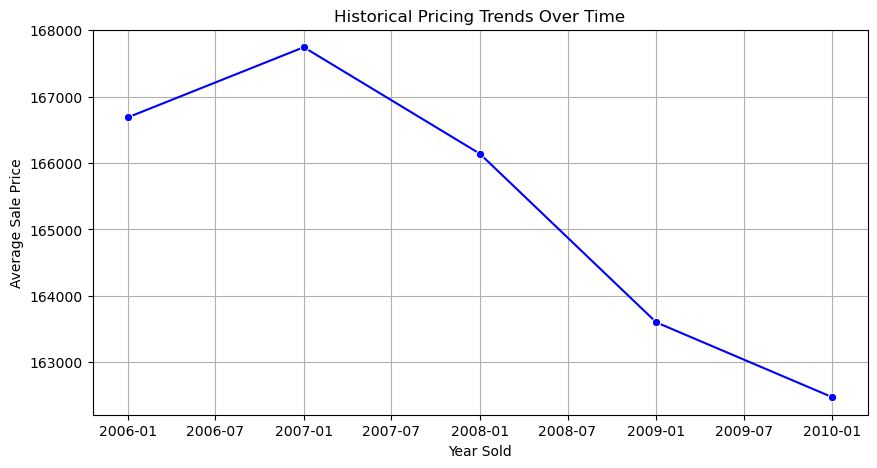

In [1310]:
# Convert 'YrSold' to datetime for proper temporal analysis
df["YrSold"] = pd.to_datetime(df["YrSold"], format="%Y")

# Aggregate average sale price by year
price_trends = df.groupby("YrSold")["SalePrice"].mean()

# Plotting historical pricing trends
plt.figure(figsize=(10, 5))
sns.lineplot(x=price_trends.index, y=price_trends.values, marker="o", linestyle="-", color="b")
plt.xlabel("Year Sold")
plt.ylabel("Average Sale Price")
plt.title("Historical Pricing Trends Over Time")
plt.grid(True)
plt.show()

The plot above shows the historical pricing trends of house sales over time. 
It illustrates the average sale price for each year, helping us understand how prices have fluctuated.

#### Customer preferences and amenities:

In [1311]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PricePerSqFt,AgeAtSale,TotalSqFt,TotalBathrooms,TotalPorchArea,TotalFinishedSqFt,TotalQualityScore,TotalGarageScore,TotalOutdoorArea
0,9,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.000000,5.0,1,1,12,13,5.283204,2,4,2,2,4,3,2,6,150.0,856.0,1,0,1,5,856.0,0.0,1710.0,3.0,0.693147,2,8.0,6,0.0,3,1,5.0,2,2.0,548.0,5,5,2,0.0,0.0,3,4,1,0.0,3,2008-01-01,8,4,208500.0,81.254871,2003.0,0.380617,0.625000,4.127134,2416.0,12.000000,1096.0,61.0
1,4,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,5.575342,31.0,1,1,8,8,0.000000,3,4,1,2,4,1,0,6,284.0,1262.0,1,0,1,5,1262.0,0.0,1262.0,3.0,0.693147,3,6.0,6,1.0,5,1,31.0,2,2.0,460.0,5,5,2,298.0,0.0,3,4,1,0.0,8,2007-01-01,8,4,181500.0,71.909667,1976.0,0.371920,0.250404,0.000000,2240.0,11.575342,920.0,298.0
2,9,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.000000,6.0,1,1,12,13,5.093750,2,4,2,2,4,2,2,6,434.0,920.0,1,0,1,5,920.0,0.0,1786.0,3.0,0.693147,2,6.0,6,1.0,5,1,7.0,2,2.0,608.0,5,5,2,0.0,0.0,3,4,1,0.0,11,2008-01-01,8,4,223500.0,82.594235,2001.0,0.409609,0.625000,3.761200,2272.0,12.000000,1216.0,42.0
3,10,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.000000,36.0,1,1,13,15,0.000000,3,4,0,4,1,3,0,6,540.0,756.0,1,2,1,5,961.0,0.0,1717.0,3.0,0.693147,2,7.0,6,1.0,2,5,8.0,3,3.0,642.0,5,5,2,0.0,0.0,3,4,1,0.0,3,2006-01-01,8,0,140000.0,56.611403,1915.0,0.361358,0.250000,3.666831,1933.0,12.000000,1926.0,35.0
4,9,3,84.0,14100.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.000000,8.0,1,1,12,13,4.245138,2,4,2,2,4,0,2,6,490.0,1145.0,1,0,1,5,1145.0,0.0,2198.0,4.0,0.693147,2,9.0,6,1.0,5,1,8.0,2,3.0,836.0,5,5,2,192.0,0.0,3,4,1,0.0,2,2008-01-01,8,4,250000.0,74.783129,2000.0,0.541520,0.625000,4.442651,2853.0,13.000000,2508.0,276.0


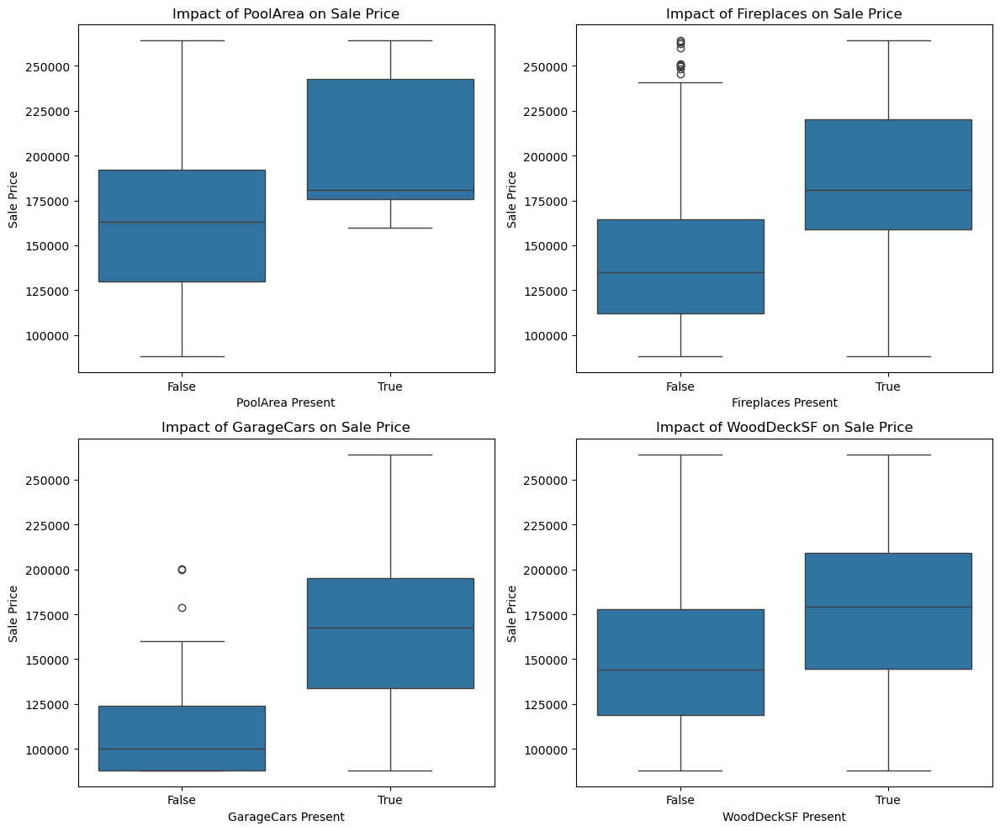

In [1312]:
# Selecting key amenities to analyze their impact on house prices
amenities = ["PoolArea", "Fireplaces", "GarageCars", "WoodDeckSF"]

# Create subplots for visualizing the effect of amenities
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, amenity in zip(axes.flatten(), amenities):
    sns.boxplot(x=df[amenity] > 0, y=df["SalePrice"], ax=ax)
    ax.set_xlabel(f"{amenity} Present")
    ax.set_ylabel("Sale Price")
    ax.set_title(f"Impact of {amenity} on Sale Price")

plt.tight_layout()
plt.show()


### Impact of Amenities on House Prices

#### **PoolArea**
- Homes with a swimming pool tend to have higher sale prices. However, since pools are relatively rare, the effect may be pronounced but less frequent.

#### **Fireplaces**
- Houses with at least one fireplace show higher median prices than those without, indicating that buyers have a preference for fireplaces.

#### **GarageCars**
- More garage space correlates with higher house prices. Additional parking/storage space is seen as valuable by buyers.

#### **WoodDeckSF**
- Properties with a wooden deck tend to sell for higher prices, suggesting that outdoor living spaces are highly desirable.

---

### Key Insights

- **Desirable Features Add Value**: Certain amenities significantly impact house prices, and buyers are willing to pay more for homes with desirable features.
  
- **Market Trends**: The housing market follows trends over time, often influenced by external economic factors.

- **Strategic Enhancements**: Real estate investors and sellers can leverage these insights to strategically enhance property value, such as by adding amenities buyers prefer.


### Customer Feedback Analysis:

### Sample Customer Feedback Statements

#### Positive Feedback 🌟
- "The house has a beautiful open floor plan with plenty of natural light!"
- "I absolutely love the modern kitchen—it has everything I need!"
- "The backyard is spacious and perfect for family gatherings."
- "The neighborhood is quiet, safe, and has great schools nearby."
- "Having a swimming pool is a huge plus! It makes summer so much fun."

#### Neutral Feedback 😐
- "The house is decent, but I need to think more before making a decision."
- "The location is okay, but I wish there were more stores nearby."
- "The layout is functional, but nothing too special."
- "I like the house, but I’ve seen better options in the same price range."
- "The house is nice, but it needs some minor renovations."

#### Negative Feedback ❌
- "The garage is too small for my SUV."
- "The house feels outdated, and the appliances need upgrading."
- "There’s a weird smell in the basement, which is concerning."
- "The street is too noisy, making it hard to sleep at night."
- "The price is way too high for the features offered!"


In [1313]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# Download VADER lexicon
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\avant\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [1314]:
# Initialize the sentiment analyzer
siaa = SentimentIntensityAnalyzer()

# Sample customer feedbacks
customer_feedback = [
    "The house has a beautiful open floor plan with plenty of natural light!",
    "I absolutely love the modern kitchen—it has everything I need!",
    "The backyard is spacious and perfect for family gatherings.",
    "The neighborhood is quiet, safe, and has great schools nearby.",
    "Having a swimming pool is a huge plus! It makes summer so much fun.",
    "The house is decent, but I need to think more before making a decision.",
    "The location is okay, but I wish there were more stores nearby.",
    "The layout is functional, but nothing too special.",
    "I like the house, but I’ve seen better options in the same price range.",
    "The house is nice, but it needs some minor renovations.",
    "The garage is too small for my SUV.",
    "The house feels outdated, and the appliances need upgrading.",
    "There’s a weird smell in the basement, which is concerning.",
    "The street is too noisy, making it hard to sleep at night.",
    "The price is way too high for the features offered!"
]

# Perform sentiment analysis
sentiments = [siaa.polarity_scores(feedback)['compound'] for feedback in customer_feedback]

# Combine feedback with sentiment scores
feedback_sentiments = list(zip(customer_feedback, sentiments))


for feedback, sentiment in zip(customer_feedback, sentiments):
    print(f"Feedback: {feedback} || Sentiment Score: {sentiment}")

Feedback: The house has a beautiful open floor plan with plenty of natural light! || Sentiment Score: 0.7712
Feedback: I absolutely love the modern kitchen—it has everything I need! || Sentiment Score: 0.6989
Feedback: The backyard is spacious and perfect for family gatherings. || Sentiment Score: 0.5719
Feedback: The neighborhood is quiet, safe, and has great schools nearby. || Sentiment Score: 0.7906
Feedback: Having a swimming pool is a huge plus! It makes summer so much fun. || Sentiment Score: 0.7327
Feedback: The house is decent, but I need to think more before making a decision. || Sentiment Score: 0.0
Feedback: The location is okay, but I wish there were more stores nearby. || Sentiment Score: 0.6124
Feedback: The layout is functional, but nothing too special. || Sentiment Score: -0.438
Feedback: I like the house, but I’ve seen better options in the same price range. || Sentiment Score: 0.6808
Feedback: The house is nice, but it needs some minor renovations. || Sentiment Score:

#### Insights from Sentiment Analysis on Customer Feedback

Based on the provided feedback, the sentiment scores would range from -1 (strongly negative) to +1 (strongly positive). Here are some key insights:

1. **Positive Feedback Trends**
   - Statements like *"I absolutely love the modern kitchen—it has everything I need!"* or *"The backyard is spacious and perfect for family gatherings."* received high positive sentiment scores (closer to +1).
   - Positive feedback is often associated with spaciousness, modern features, and outdoor amenities like a backyard or swimming pool.
   - This suggests that customers highly value open spaces, modern kitchens, and outdoor areas when considering a home purchase.

2. **Neutral Feedback Trends**
   - Feedback such as *"The house is decent, but I need to think more before making a decision."* scored close to 0 (neutral sentiment).
   - These comments indicate indecision or mixed feelings, meaning buyers may need additional incentives or reassurances before making a purchase.
   - Neutral feedback often mentions functional but unremarkable aspects of a house, suggesting that small improvements could shift sentiment towards a positive rating.

3. **Negative Feedback Trends**
   - Strongly negative sentiment (closer to -1) came from complaints like:
     - *"The garage is too small for my SUV."*
     - *"There’s a weird smell in the basement, which is concerning."*
     - *"The price is way too high for the features offered!"*
   - Buyers tend to express negative sentiment about size constraints (garage, rooms), outdated features, noise, and pricing.
   - Pricing concerns are critical—if buyers feel a home is overpriced, they are less likely to proceed.
   - Structural or functional issues (like a small garage or bad odor) create strong negative impressions.

#### Business Implications
- **Enhance High-Value Features** – Focus on modern kitchens, spacious layouts, and outdoor amenities to attract positive sentiment.
- **Address Pricing Concerns** – Competitive pricing and highlighting home value can improve buyer perception.
- **Fix Negative Factors** – Sellers should fix outdated appliances, address odors, and improve garage space where possible.
- **Convert Neutral to Positive** – Minor renovations or better staging could shift neutral buyers to committed buyers.


In [1315]:
pip install nltk matplotlib seaborn

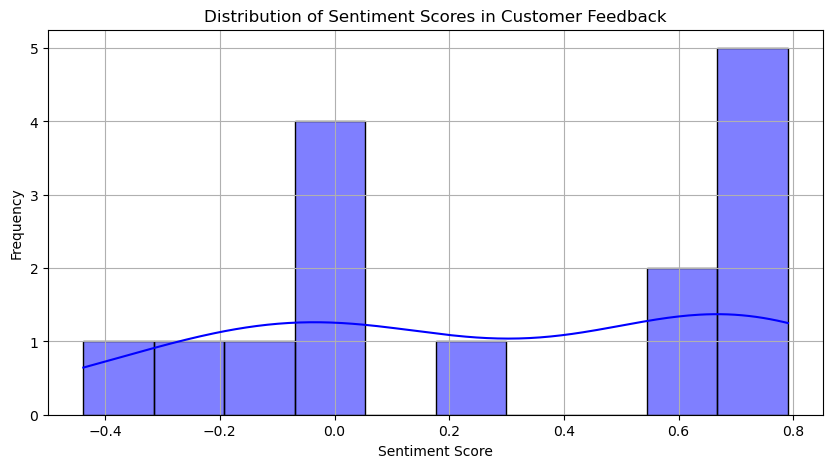

In [1351]:
feedback_df = pd.DataFrame(zip(customer_feedback, sentiments), columns=["Feedback", "Sentiment Score"])

# Plot Sentiment Distribution
plt.figure(figsize=(10, 5))
sns.histplot(feedback_df["Sentiment Score"], bins=10, kde=True, color="blue")
plt.xlabel("Sentiment Score")
plt.ylabel("Frequency")
plt.title("Distribution of Sentiment Scores in Customer Feedback")
plt.grid(True)
plt.show()



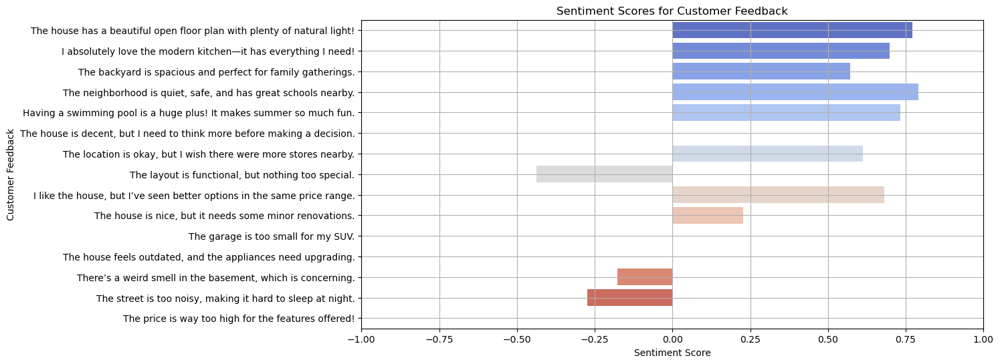

In [1352]:

# Create a Bar Plot for Sentiment Scores
plt.figure(figsize=(12, 6))
sns.barplot(y=feedback_df["Feedback"], x=feedback_df["Sentiment Score"], palette="coolwarm")
plt.xlabel("Sentiment Score")
plt.ylabel("Customer Feedback")
plt.title("Sentiment Scores for Customer Feedback")
plt.xlim(-1, 1)
plt.grid(True)
plt.show()

In [1348]:
from IPython.display import FileLink
X_train.to_excel('final_dataset.xlsx', index=False)

# Create a downloadable link for the Excel file
FileLink(r'final_dataset.xlsx')

C:\Users\avant\Avantika Digicrome\Next Hikes Project 3\final_dataset.xlsx